# Comprehensive EDA: Boston Housing Dataset

This notebook provides a complete exploratory data analysis of the Boston Housing dataset with:
- Data quality checks
- Univariate and bivariate analysis
- Multivariate exploration
- Geographic visualization
- Outlier detection
- Feature engineering
- Statistical tests
- Key insights generation

## Load Required Libraries

In [77]:
# Install packages if needed (uncomment if required)
# install.packages('IRkernel')
# install.packages(c('mlbench', 'ggplot2', 'dplyr', 'tidyr', 'corrplot', 'gridExtra', 'scales', 'psych', 'car', 'moments', 'GGally', 'viridis'))

# Load libraries
library(mlbench)
library(ggplot2)
library(dplyr)
library(tidyr)
library(corrplot)
library(gridExtra)
library(scales)
library(psych)
library(car)
library(moments)
library(viridis)

## Load Dataset

In [78]:
data("BostonHousing2", package = "mlbench")
boston <- BostonHousing2

## 1. Data Structure & Quality Checks

In [79]:
str(boston)

'data.frame':	506 obs. of  19 variables:
 $ town   : Factor w/ 92 levels "Arlington","Ashland",..: 54 77 77 46 46 46 69 69 69 69 ...
 $ tract  : int  2011 2021 2022 2031 2032 2033 2041 2042 2043 2044 ...
 $ lon    : num  -71 -71 -70.9 -70.9 -70.9 ...
 $ lat    : num  42.3 42.3 42.3 42.3 42.3 ...
 $ medv   : num  24 21.6 34.7 33.4 36.2 28.7 22.9 27.1 16.5 18.9 ...
 $ cmedv  : num  24 21.6 34.7 33.4 36.2 28.7 22.9 22.1 16.5 18.9 ...
 $ crim   : num  0.00632 0.02731 0.02729 0.03237 0.06905 ...
 $ zn     : num  18 0 0 0 0 0 12.5 12.5 12.5 12.5 ...
 $ indus  : num  2.31 7.07 7.07 2.18 2.18 2.18 7.87 7.87 7.87 7.87 ...
 $ chas   : Factor w/ 2 levels "0","1": 1 1 1 1 1 1 1 1 1 1 ...
 $ nox    : num  0.538 0.469 0.469 0.458 0.458 0.458 0.524 0.524 0.524 0.524 ...
 $ rm     : num  6.58 6.42 7.18 7 7.15 ...
 $ age    : num  65.2 78.9 61.1 45.8 54.2 58.7 66.6 96.1 100 85.9 ...
 $ dis    : num  4.09 4.97 4.97 6.06 6.06 ...
 $ rad    : int  1 2 2 3 3 3 5 5 5 5 ...
 $ tax    : int  296 242 242 222 2

In [ ]:
cat(paste("Rows:", nrow(boston), "| Columns:", ncol(boston), "\n"))

Rows: 506 | Columns: 19 


In [81]:
head(boston)

,town,tract,lon,lat,medv,cmedv,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat
,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>
1,Nahant,2011,-70.9550,42.2550,24.0,24.0,0.00632,18,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98
2,Swampscott,2021,-70.9500,42.2875,21.6,21.6,0.02731,0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14
3,Swampscott,2022,-70.9360,42.2830,34.7,34.7,0.02729,0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03
4,Marblehead,2031,-70.9280,42.2930,33.4,33.4,0.03237,0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94
5,Marblehead,2032,-70.9220,42.2980,36.2,36.2,0.06905,0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33
6,Marblehead,2033,-70.9165,42.3040,28.7,28.7,0.02985,0,2.18,0,0.458,6.430,58.7,6.0622,3,222,18.7,394.12,5.21


In [82]:
cat("check for missing values in each variable:\n")
missing_summary <- data.frame(
  Variable = names(boston),
  Missing_Count = sapply(boston, function(x) sum(is.na(x))),
  Missing_Percent = sapply(boston, function(x) round(100 * sum(is.na(x)) / length(x), 2))
)
print(missing_summary[missing_summary$Missing_Count > 0, ])

check for missing values in each variable:
[1] Variable        Missing_Count   Missing_Percent
<0 rows> (or 0-length row.names)


In [84]:
cat("check for any duplicate rows:\n")
cat(paste("Number of duplicate rows:", sum(duplicated(boston)), "\n"))


check for any duplicate rows:
Number of duplicate rows: 0 


In [85]:
cat("study the datatypes of each variable:\n")
print(sapply(boston, class))

study the datatypes of each variable:
     town     tract       lon       lat      medv     cmedv      crim        zn 
 "factor" "integer" "numeric" "numeric" "numeric" "numeric" "numeric" "numeric" 
    indus      chas       nox        rm       age       dis       rad       tax 
"numeric"  "factor" "numeric" "numeric" "numeric" "numeric" "integer" "integer" 
  ptratio         b     lstat 
"numeric" "numeric" "numeric" 


## 2. Univariate Analysis - Numerical Variables

In [88]:
# Summary Statistics for Numerical Variables
numerical_vars <- boston %>% select_if(is.numeric) %>% select(-tract, -lat, -lon, -medv)
cat("Get teh summary statistics of numerical variables:\n")
summary(numerical_vars)

Get teh summary statistics of numerical variables:


     cmedv            crim                zn             indus      
 Min.   : 5.00   Min.   : 0.00632   Min.   :  0.00   Min.   : 0.46  
 1st Qu.:17.02   1st Qu.: 0.08205   1st Qu.:  0.00   1st Qu.: 5.19  
 Median :21.20   Median : 0.25651   Median :  0.00   Median : 9.69  
 Mean   :22.53   Mean   : 3.61352   Mean   : 11.36   Mean   :11.14  
 3rd Qu.:25.00   3rd Qu.: 3.67708   3rd Qu.: 12.50   3rd Qu.:18.10  
 Max.   :50.00   Max.   :88.97620   Max.   :100.00   Max.   :27.74  
      nox               rm             age              dis        
 Min.   :0.3850   Min.   :3.561   Min.   :  2.90   Min.   : 1.130  
 1st Qu.:0.4490   1st Qu.:5.886   1st Qu.: 45.02   1st Qu.: 2.100  
 Median :0.5380   Median :6.208   Median : 77.50   Median : 3.207  
 Mean   :0.5547   Mean   :6.285   Mean   : 68.57   Mean   : 3.795  
 3rd Qu.:0.6240   3rd Qu.:6.623   3rd Qu.: 94.08   3rd Qu.: 5.188  
 Max.   :0.8710   Max.   :8.780   Max.   :100.00   Max.   :12.127  
      rad              tax           ptra

In [89]:
skew_kurt <- data.frame(
  Variable = names(numerical_vars),
  Skewness = sapply(numerical_vars, skewness, na.rm = TRUE),
  Kurtosis = sapply(numerical_vars, kurtosis, na.rm = TRUE)
)
print(dplyr::mutate_if(skew_kurt, is.numeric, round, digits = 3))

        Variable Skewness Kurtosis
cmedv      cmedv    1.108    4.490
crim        crim    5.208   39.753
zn            zn    2.219    6.980
indus      indus    0.294    1.767
nox          nox    0.727    2.924
rm            rm    0.402    4.861
age          age   -0.597    2.030
dis          dis    1.009    3.471
rad          rad    1.002    2.129
tax          tax    0.668    1.857
ptratio  ptratio   -0.800    2.706
b              b   -2.882   10.144
lstat      lstat    0.904    3.477


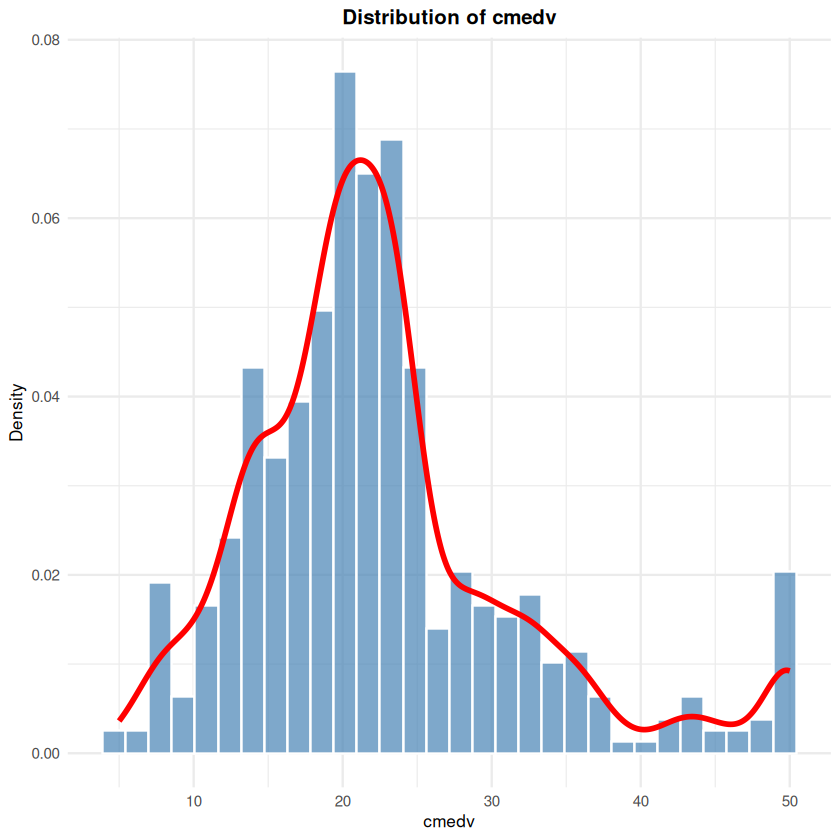

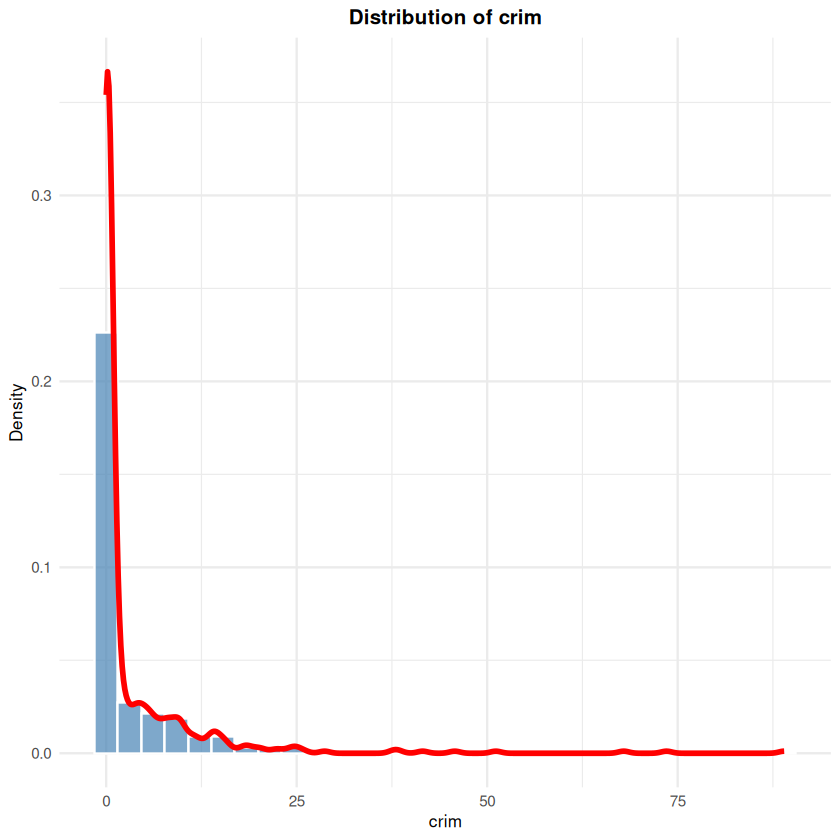

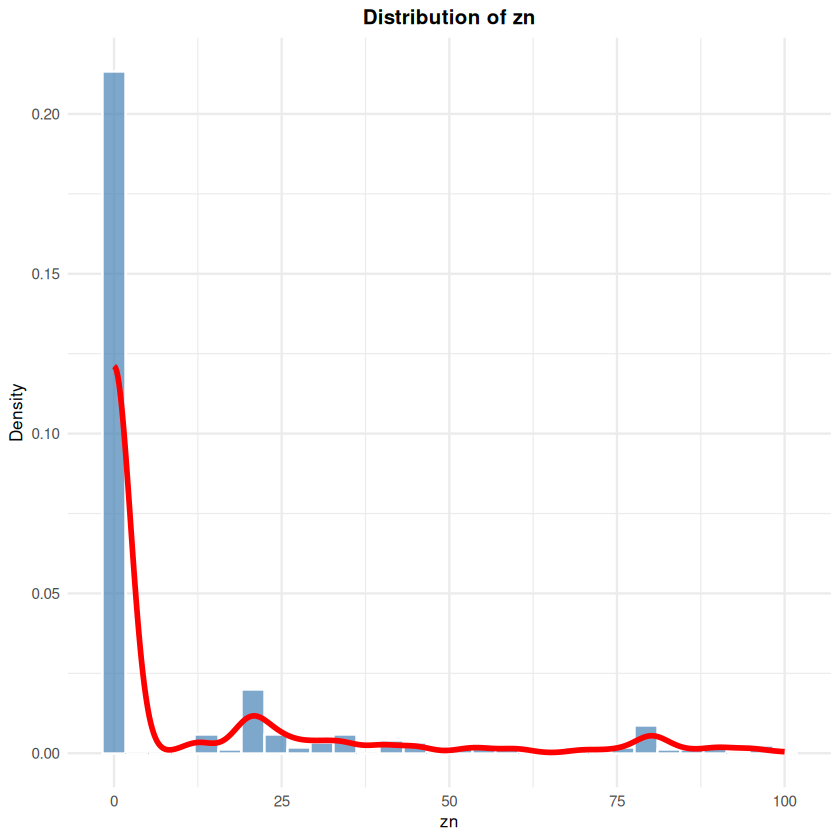

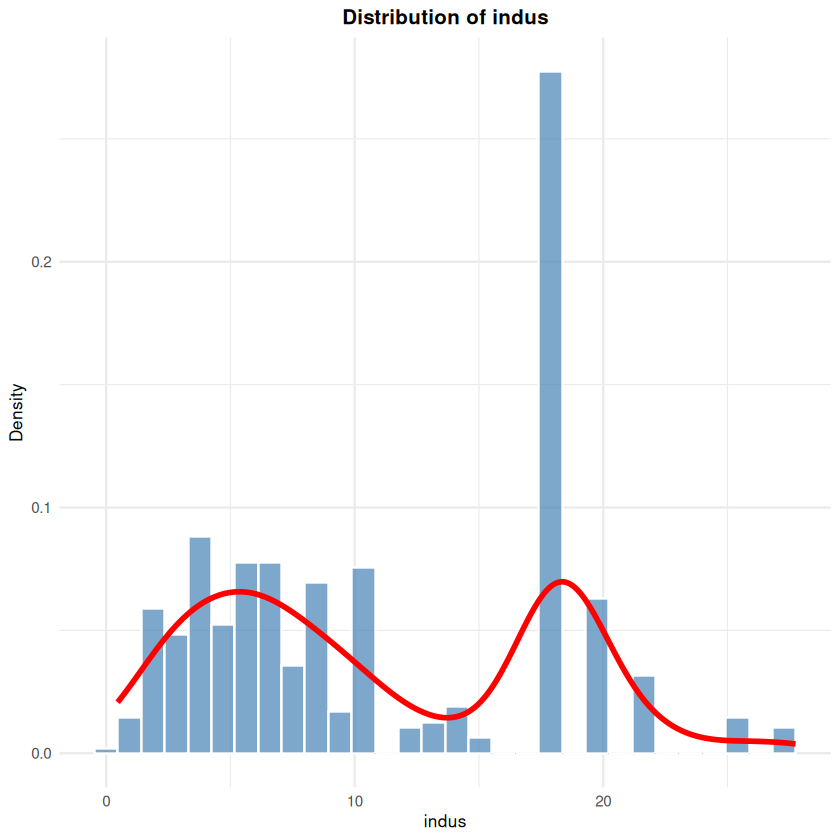

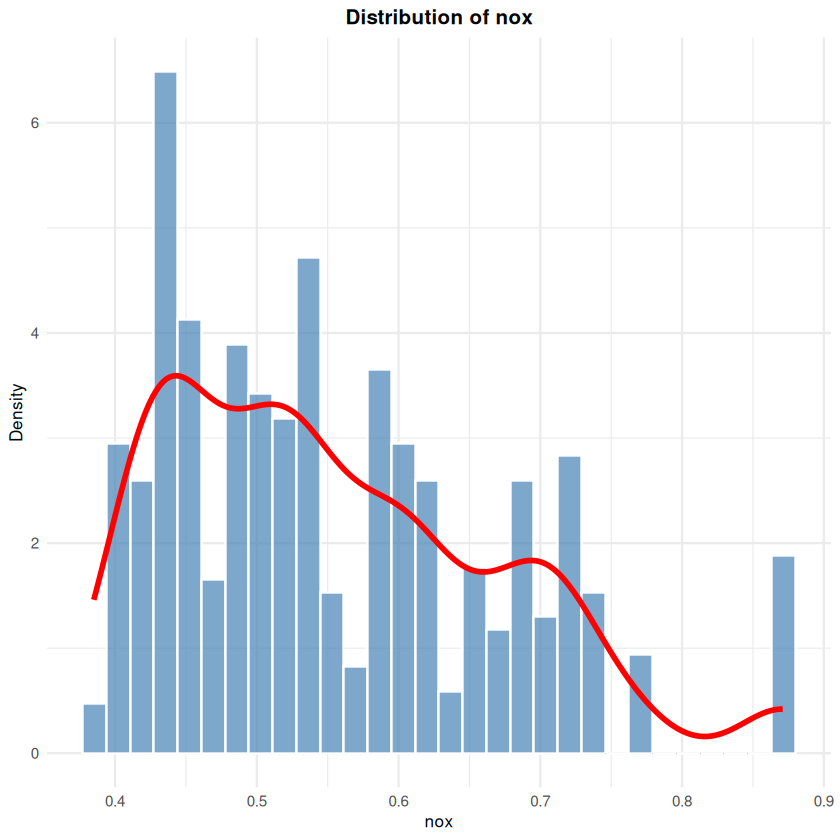

...

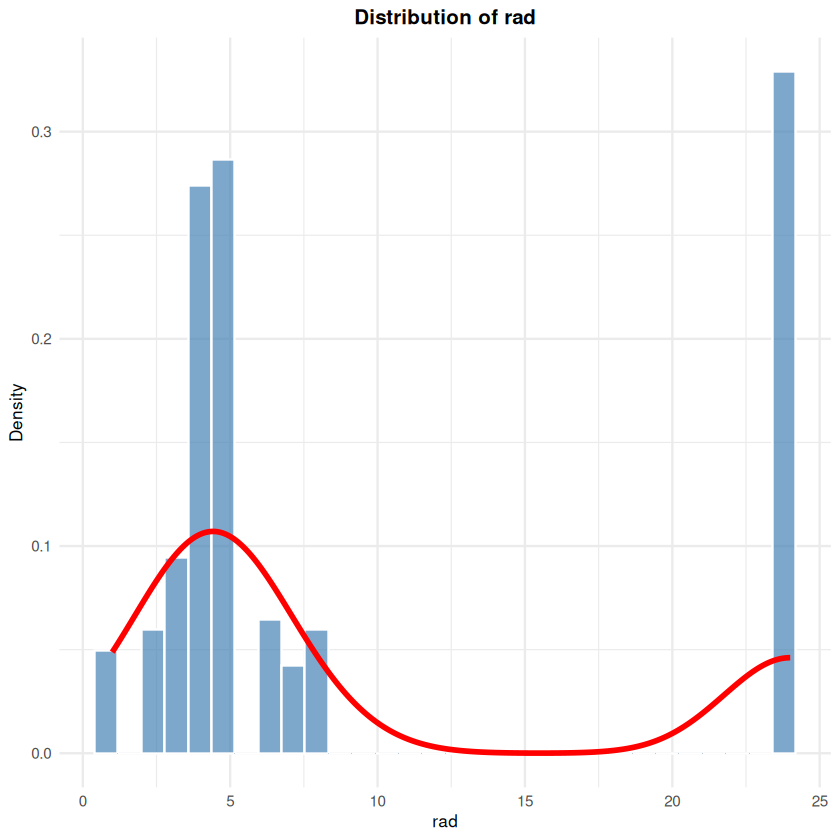

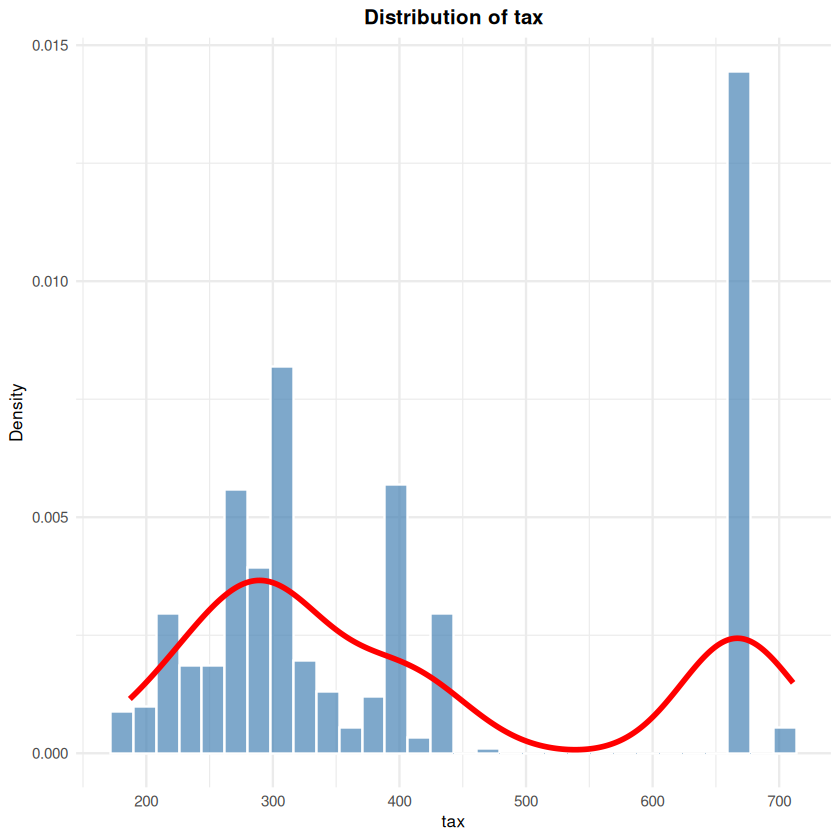

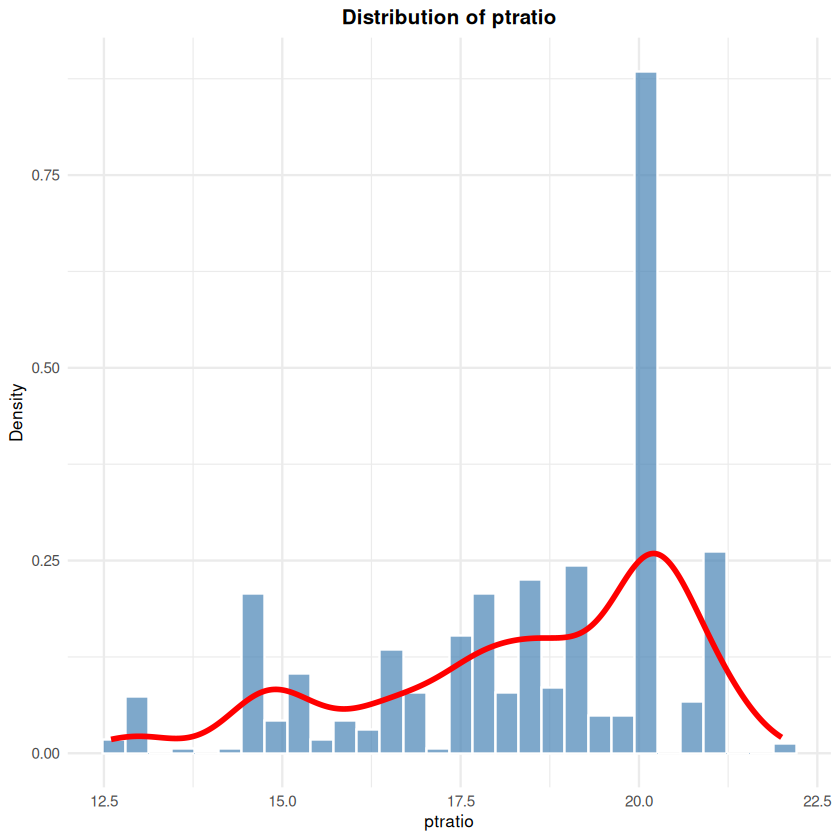

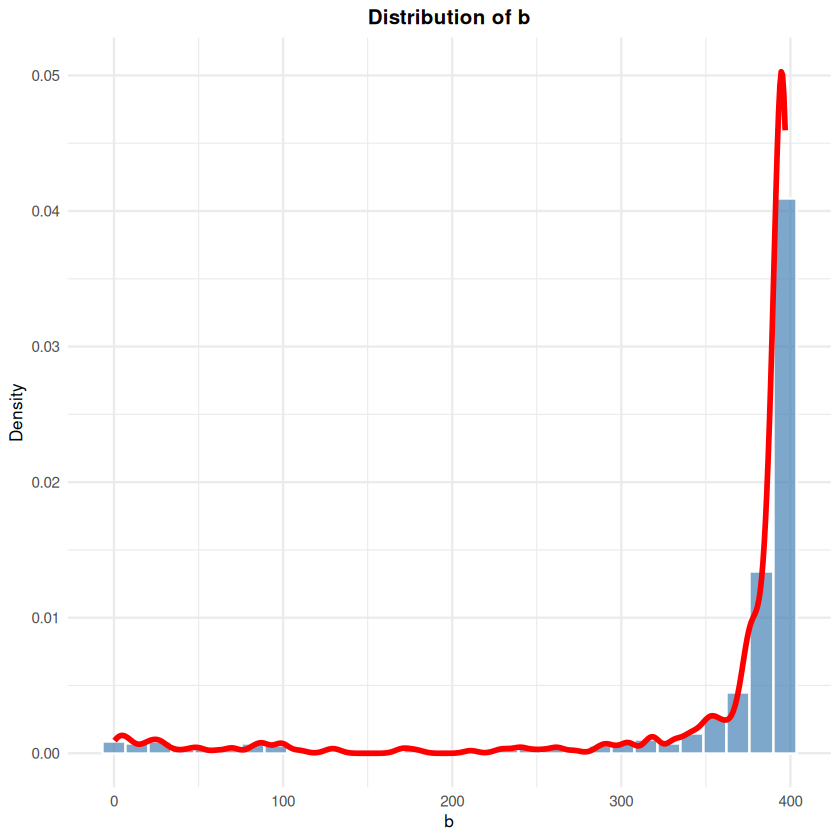

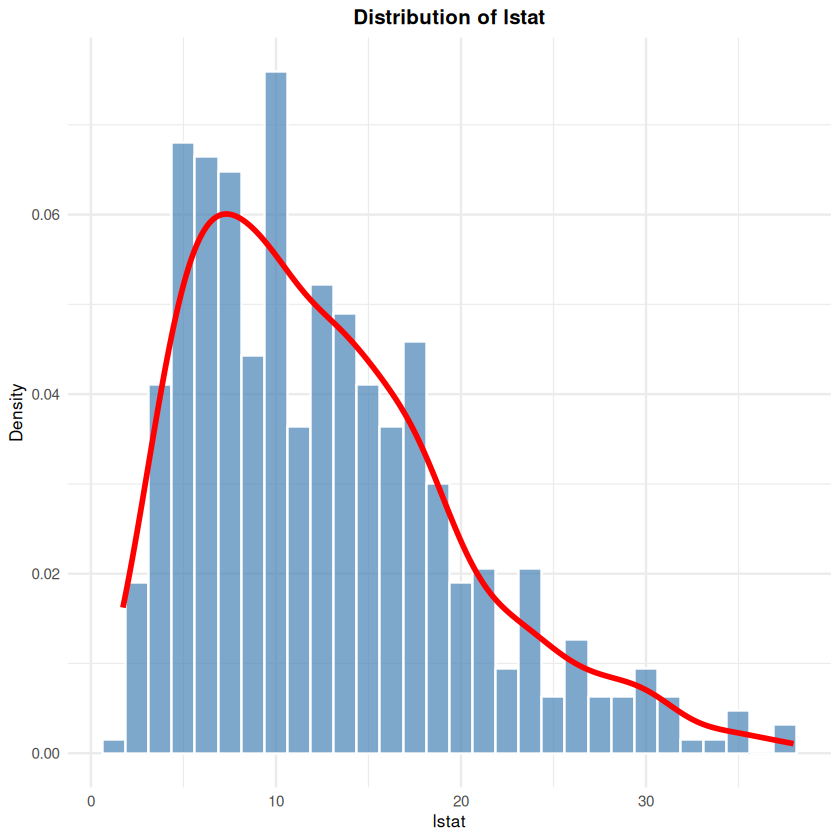

In [94]:
# Create distribution plots with histograms and density curves
plot_list <- list()

for (var in names(numerical_vars)) {
  p <- ggplot(boston, aes(x = .data[[var]])) +
    geom_histogram(aes(y = after_stat(density)), 
                   bins = 30, 
                   fill = "steelblue", 
                   alpha = 0.7, 
                   color = "white") +
    geom_density(color = "red", linewidth = 1.2) +
    labs(
      title = paste("Distribution of", var),
      x = var,
      y = "Density"
    ) +
    theme_minimal() +
    theme(
      plot.title = element_text(hjust = 0.5, face = "bold", size = 12),
      axis.title = element_text(size = 10)
    )
  
  plot_list[[var]] <- p
  
  # Save plot to disk
  ggsave(
    filename = paste0("assets/distribution_", var, ".png"),
    plot = p,
    width = 8,
    height = 6,
    dpi = 300
  )
}

# Display each plot
for (p in plot_list) {
  print(p)
}

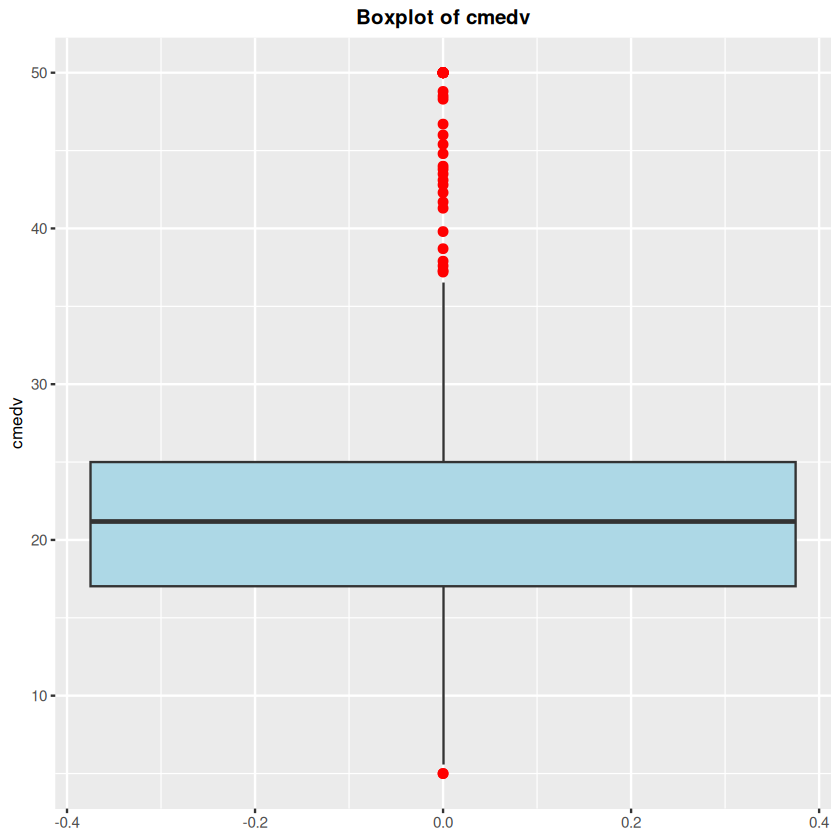

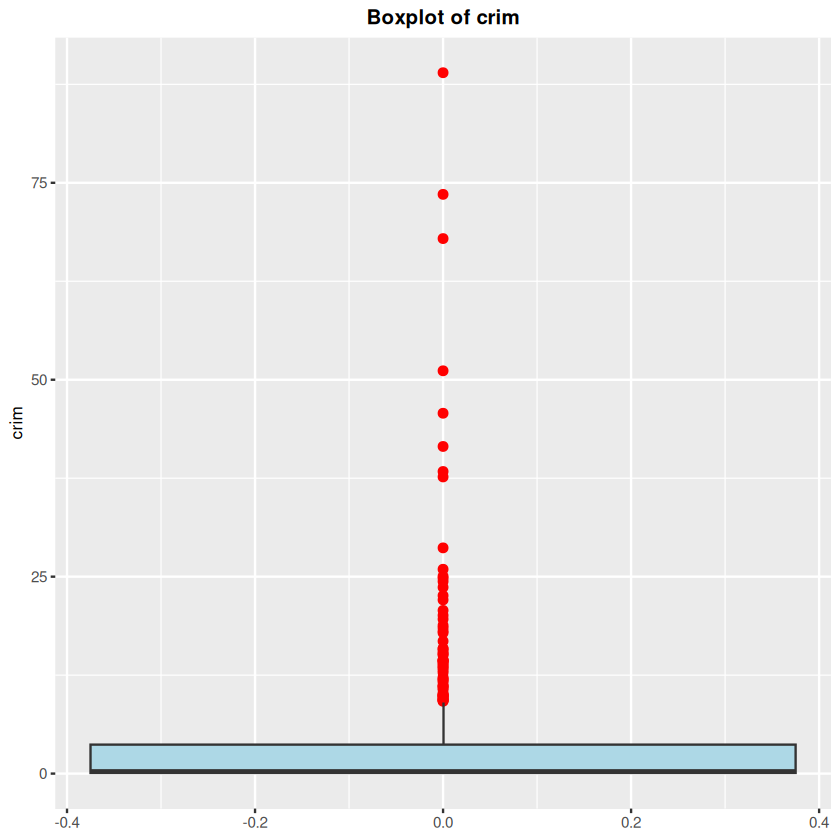

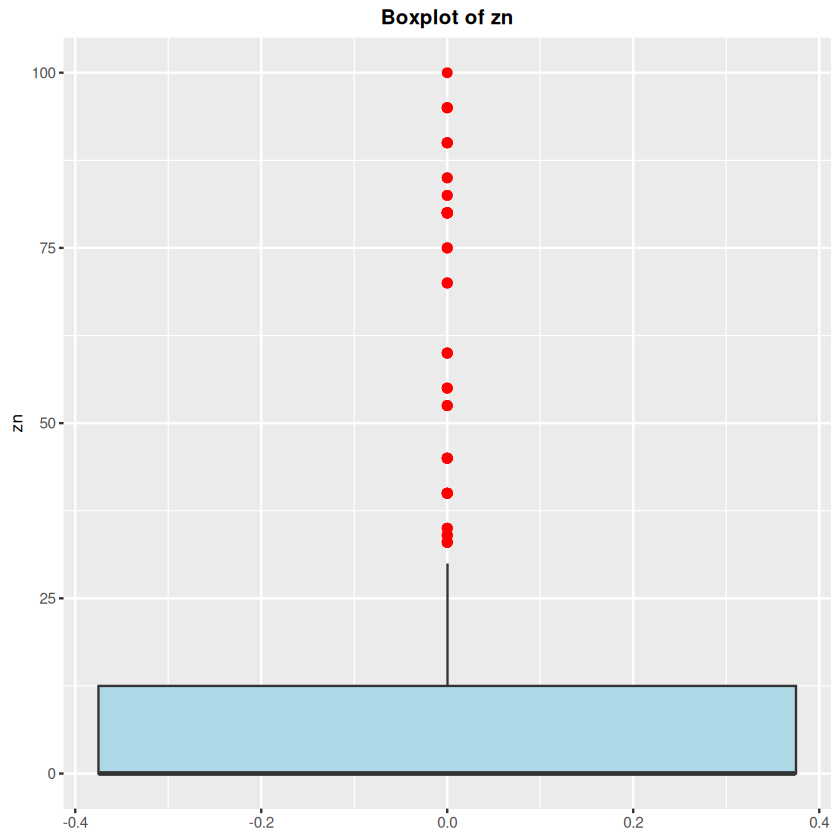

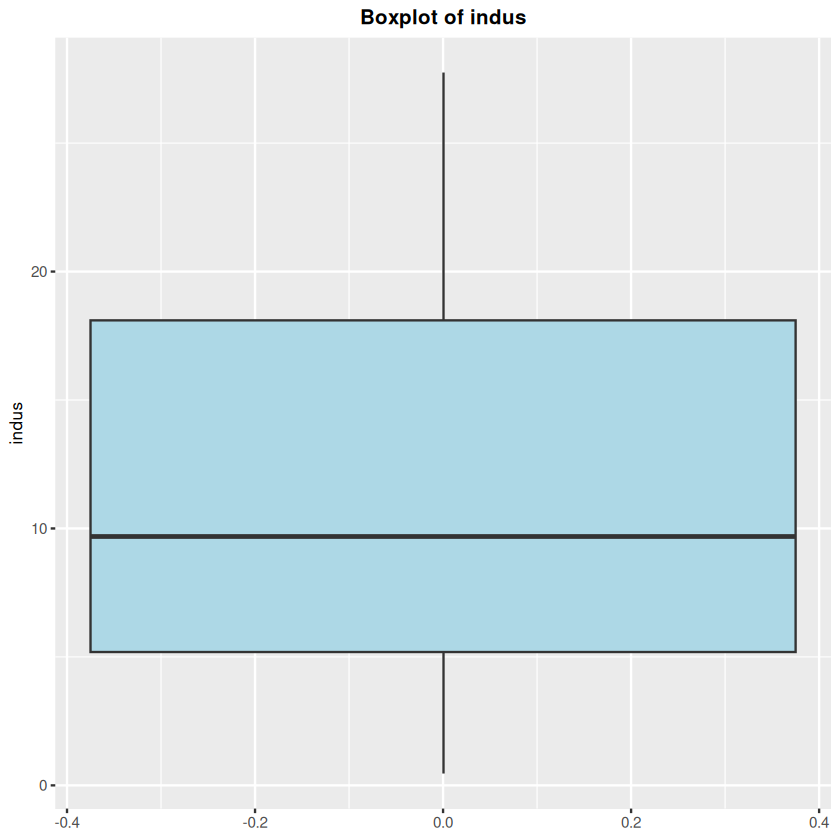

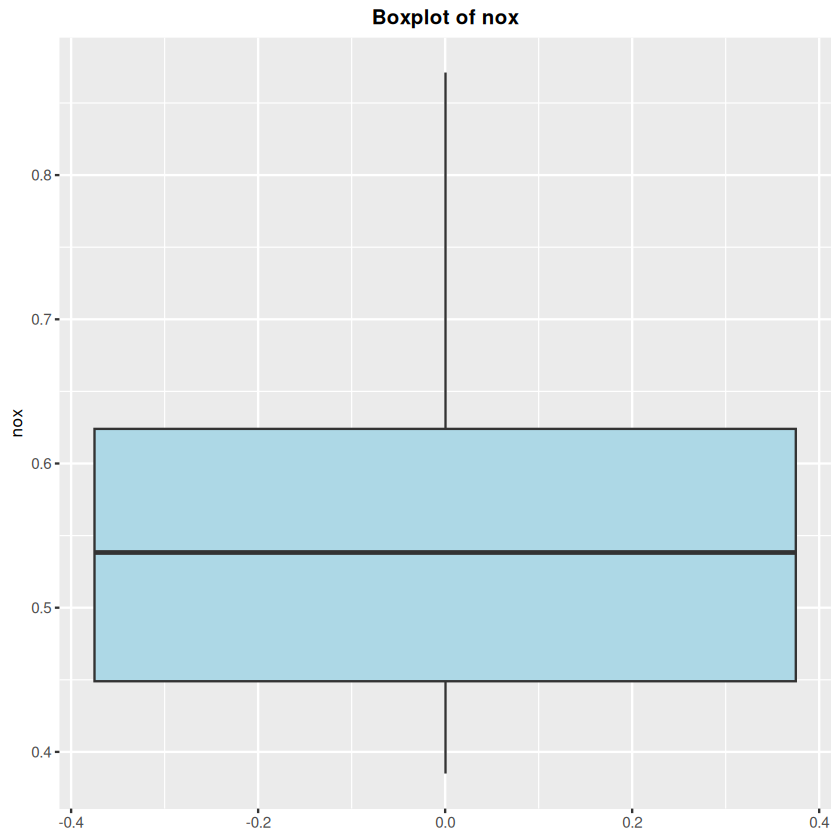

...

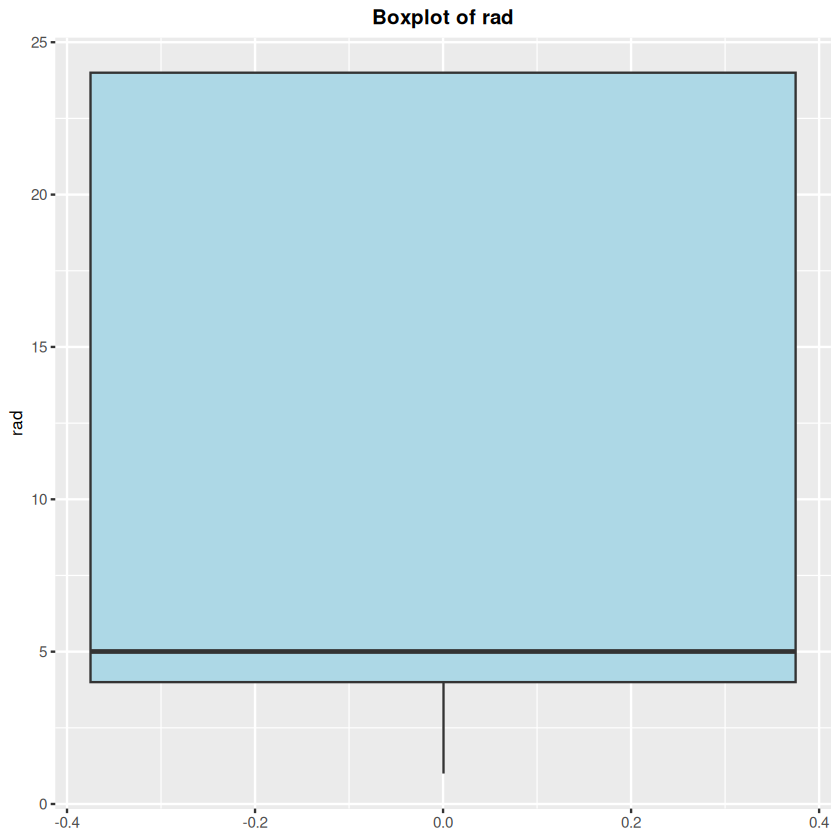

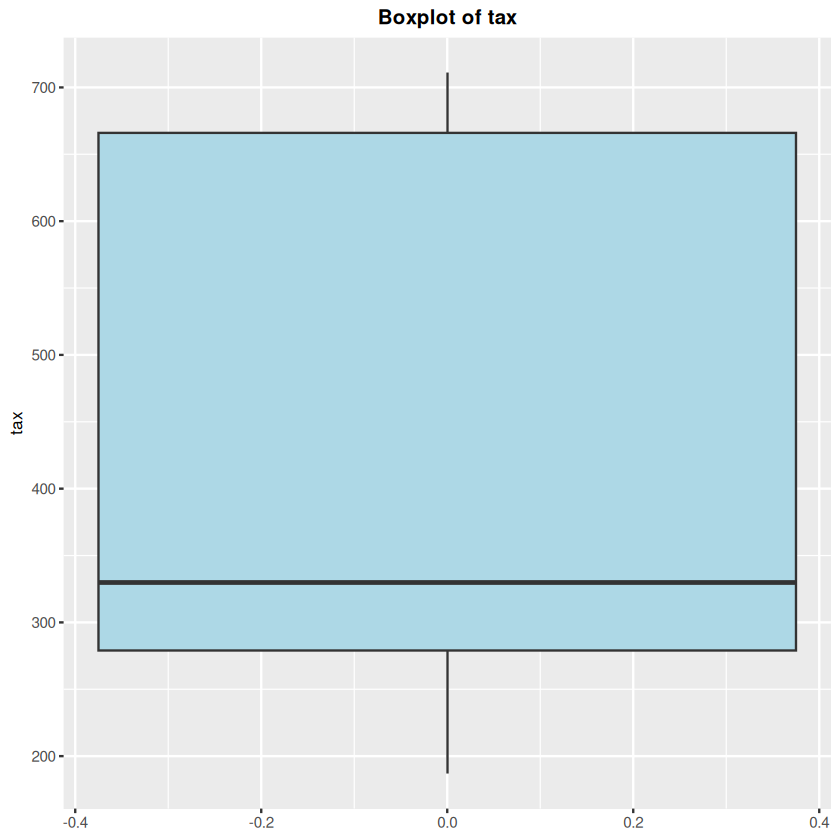

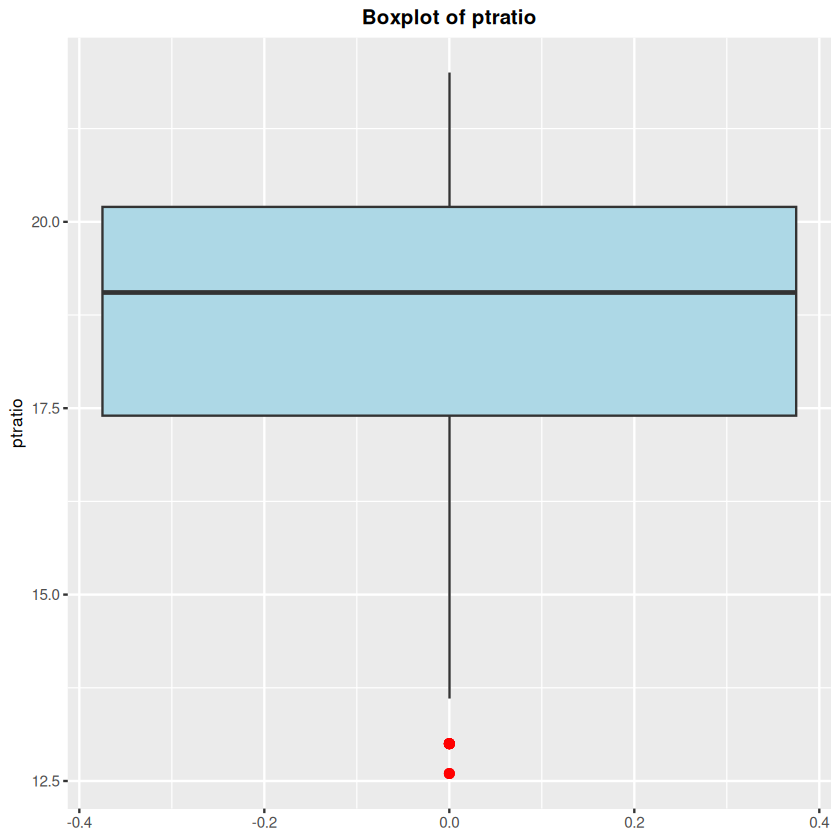

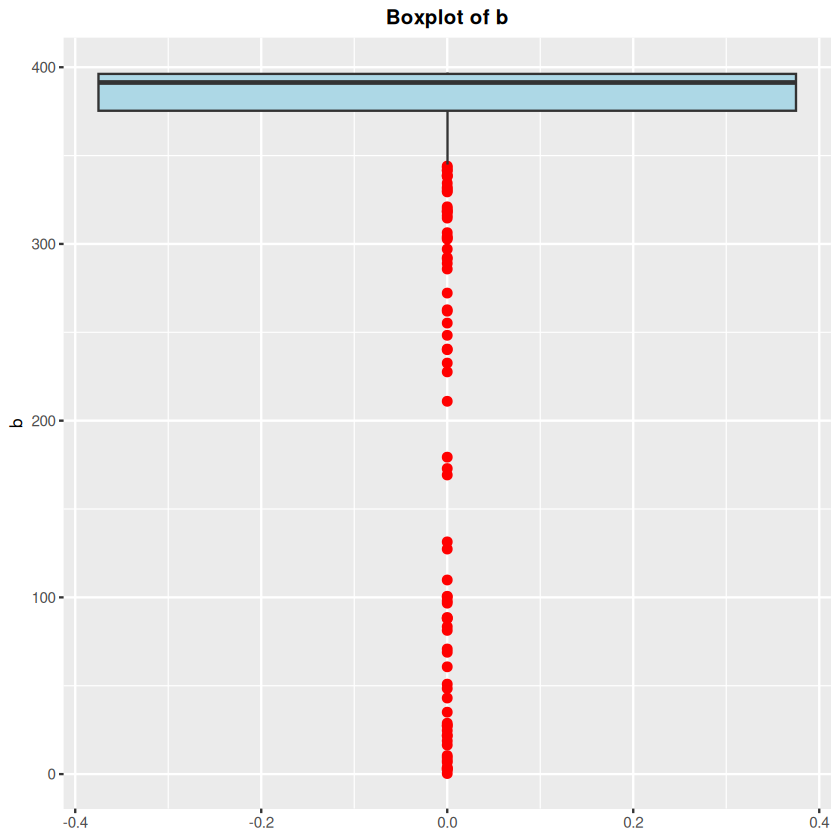

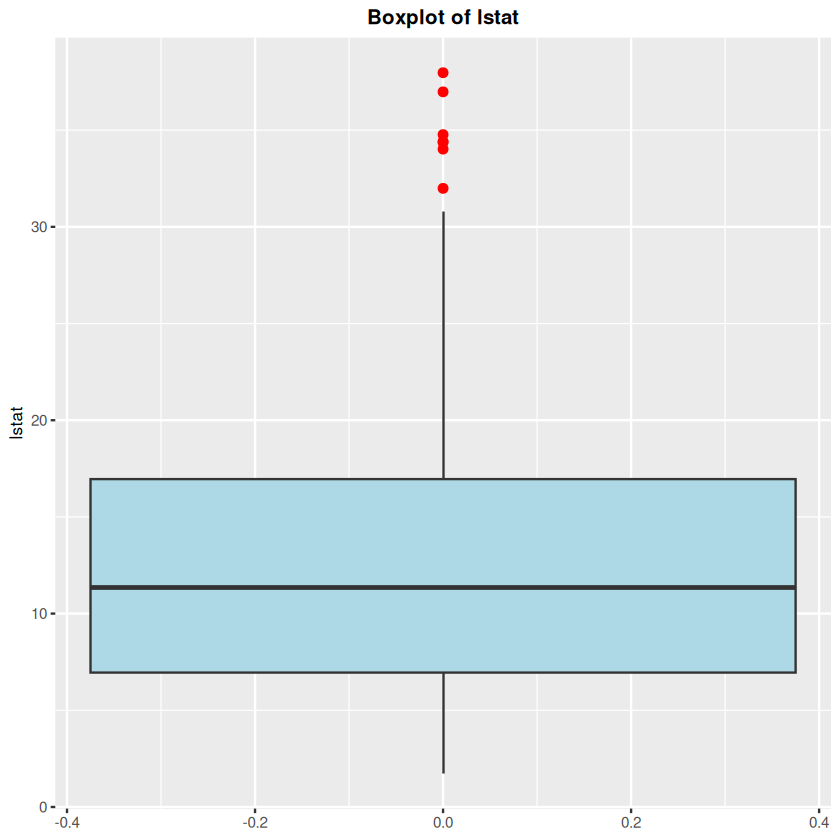

In [95]:
# Boxplots for Outlier Detection
# Create boxplots for outlier detection in numerical variables
boxplot_list <- list()

for (var in names(numerical_vars)) {
  p <- ggplot(boston, aes(y = .data[[var]])) +
    geom_boxplot(fill = "lightblue", outlier.color = "red", outlier.size = 2) +
    labs(
      title = paste("Boxplot of", var),
      y = var
    ) +
    theme(
      plot.title = element_text(hjust = 0.5, face = "bold", size = 12),
      axis.title = element_text(size = 10)
    )
  
  boxplot_list[[var]] <- p
  
  # Save plot to disk
  ggsave(
    filename = paste0("assets/boxplot_", var, ".png"),
    plot = p,
    width = 8,
    height = 6,
    dpi = 300
  )
}

# Display each plot
for (p in boxplot_list) {
  print(p)
}

## 3. Univariate Analysis - Categorical Variables

In [96]:
# Frequency tables for categorical variables

if ("chas" %in% names(boston)) {
  cat("\nCharles River Dummy Variable (chas):\n")
  print(table(boston$chas))
  print(prop.table(table(boston$chas)) * 100)
}


Charles River Dummy Variable (chas):

  0   1 
471  35 

        0         1 
93.083004  6.916996 


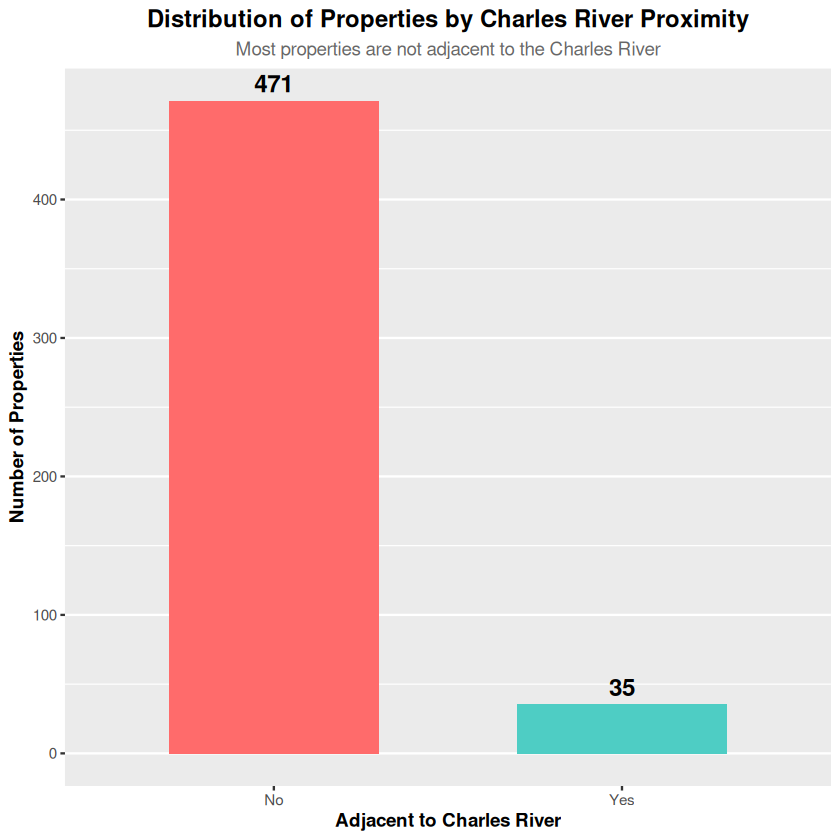

In [97]:
# Visualize the distribution of properties near Charles River
if ("chas" %in% names(boston)) {
  ggplot(boston, aes(x = factor(chas, labels = c("No", "Yes")), 
                     fill = factor(chas))) +
    geom_bar(width = 0.6) +
    geom_text(stat = 'count', 
              aes(label = after_stat(count)), 
              vjust = -0.5, 
              size = 5,
              fontface = "bold") +
    labs(
      title = "Distribution of Properties by Charles River Proximity",
      subtitle = "Most properties are not adjacent to the Charles River",
      x = "Adjacent to Charles River",
      y = "Number of Properties"
    ) +
    scale_fill_manual(values = c("0" = "#FF6B6B", "1" = "#4ECDC4")) +
    theme(
      legend.position = "none",
      plot.title = element_text(hjust = 0.5, face = "bold", size = 14),
      plot.subtitle = element_text(hjust = 0.5, size = 11, color = "gray40"),
      axis.title = element_text(face = "bold"),
      panel.grid.major.x = element_blank()
    )
}

## 4. Bivariate Analysis

In [98]:
# Correlation Matrix
cor_matrix <- cor(numerical_vars, use = "complete.obs")
print(round(cor_matrix, 2))

        cmedv  crim    zn indus   nox    rm   age   dis   rad   tax ptratio
cmedv    1.00 -0.39  0.36 -0.48 -0.43  0.70 -0.38  0.25 -0.38 -0.47   -0.51
crim    -0.39  1.00 -0.20  0.41  0.42 -0.22  0.35 -0.38  0.63  0.58    0.29
zn       0.36 -0.20  1.00 -0.53 -0.52  0.31 -0.57  0.66 -0.31 -0.31   -0.39
indus   -0.48  0.41 -0.53  1.00  0.76 -0.39  0.64 -0.71  0.60  0.72    0.38
nox     -0.43  0.42 -0.52  0.76  1.00 -0.30  0.73 -0.77  0.61  0.67    0.19
rm       0.70 -0.22  0.31 -0.39 -0.30  1.00 -0.24  0.21 -0.21 -0.29   -0.36
age     -0.38  0.35 -0.57  0.64  0.73 -0.24  1.00 -0.75  0.46  0.51    0.26
dis      0.25 -0.38  0.66 -0.71 -0.77  0.21 -0.75  1.00 -0.49 -0.53   -0.23
rad     -0.38  0.63 -0.31  0.60  0.61 -0.21  0.46 -0.49  1.00  0.91    0.46
tax     -0.47  0.58 -0.31  0.72  0.67 -0.29  0.51 -0.53  0.91  1.00    0.46
ptratio -0.51  0.29 -0.39  0.38  0.19 -0.36  0.26 -0.23  0.46  0.46    1.00
b        0.33 -0.39  0.18 -0.36 -0.38  0.13 -0.27  0.29 -0.44 -0.44   -0.18
lstat   -0.7

pdf 
  2

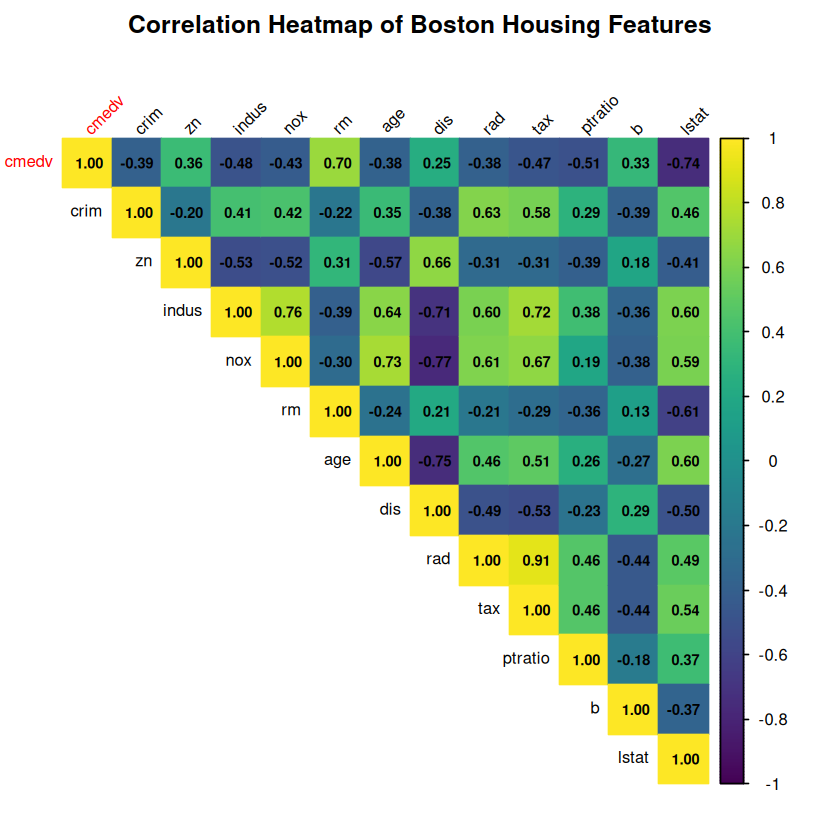

In [113]:
# Correlation Heatmap with modern styling and cmedv in RED
png("assets/correlation_heatmap.png", width = 10, height = 10, units = "in", res = 300)

# Create custom color vector for variable names
var_names <- colnames(cor_matrix)
text_colors <- ifelse(var_names == "cmedv", "red", "black")

corrplot(cor_matrix, 
         method = "color", 
         type = "upper",
         tl.col = text_colors,  # Use custom color vector
         tl.srt = 45,
         tl.cex = 0.8,
         addCoef.col = "black", 
         number.cex = 0.7,
         number.digits = 2,
         col = viridis(200),
         title = "Correlation Heatmap of Boston Housing Features",
         mar = c(0, 0, 2, 0),
         cl.cex = 0.8)
dev.off()

# Display the plot
text_colors <- ifelse(var_names == "cmedv", "red", "black")

corrplot(cor_matrix, 
         method = "color", 
         type = "upper",
         tl.col = text_colors,
         tl.srt = 45,
         tl.cex = 0.8,
         addCoef.col = "black", 
         number.cex = 0.7,
         number.digits = 2,
         col = viridis(200),
         title = "Correlation Heatmap of Boston Housing Features",
         mar = c(0, 0, 2, 0),
         cl.cex = 0.8)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


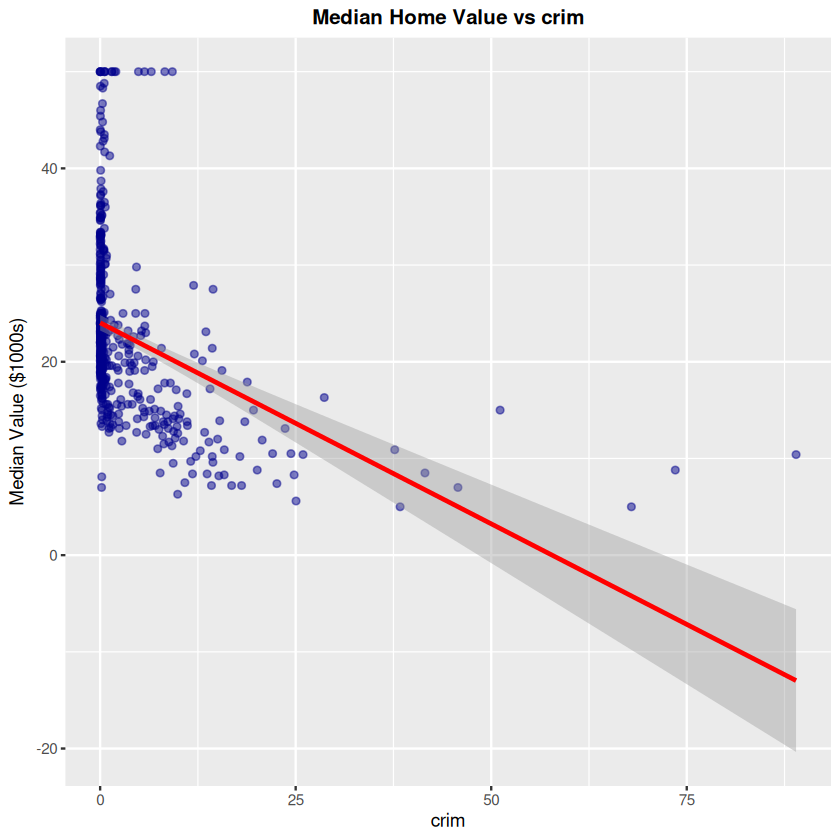

`geom_smooth()` using formula = 'y ~ x'


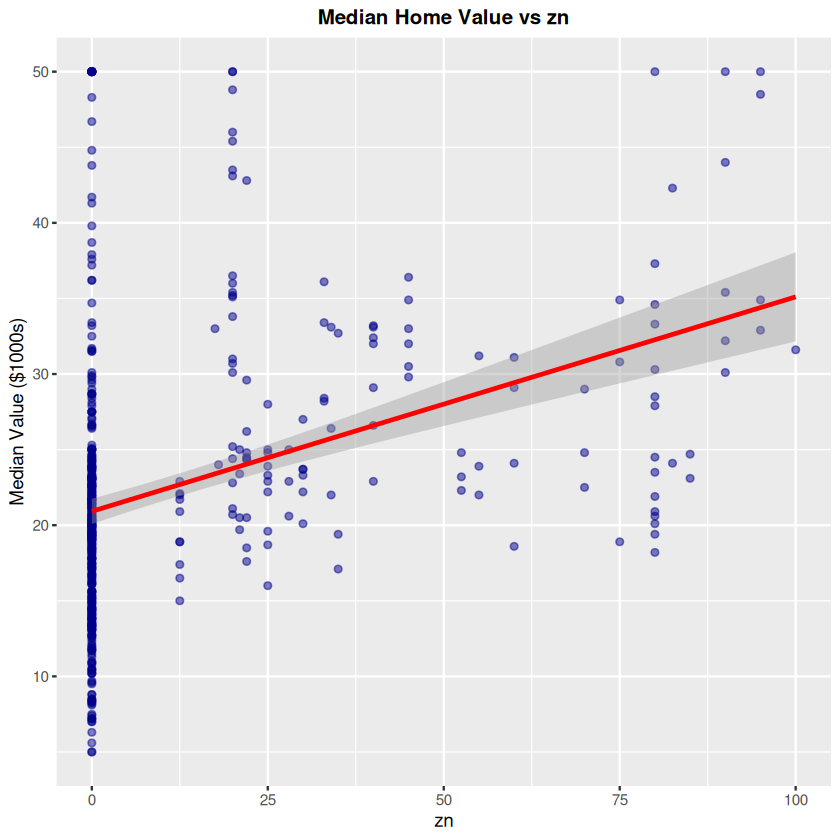

`geom_smooth()` using formula = 'y ~ x'


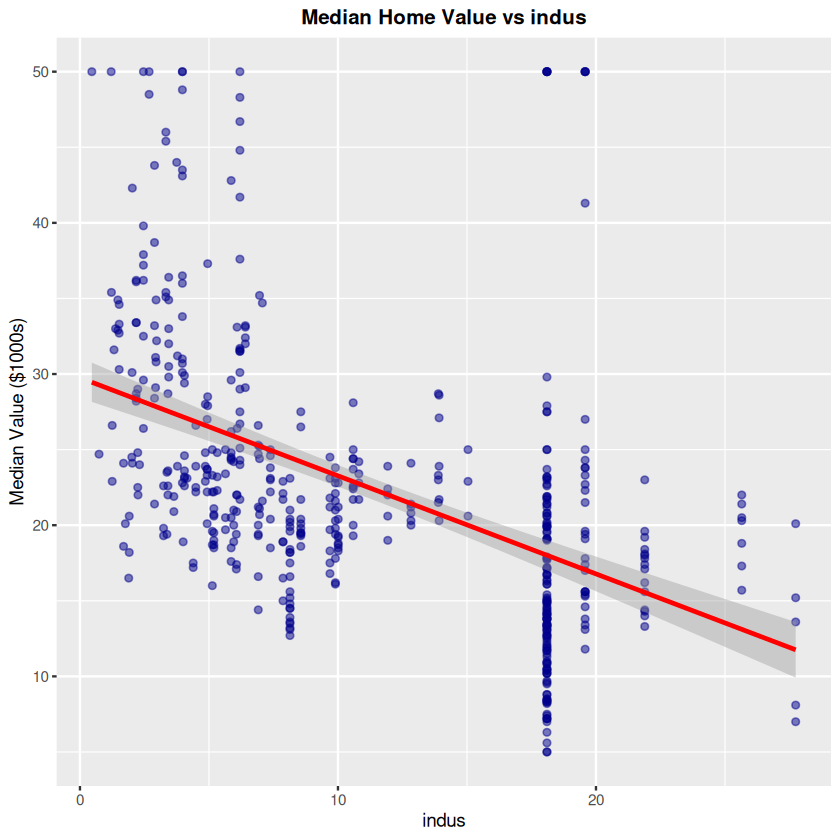

`geom_smooth()` using formula = 'y ~ x'


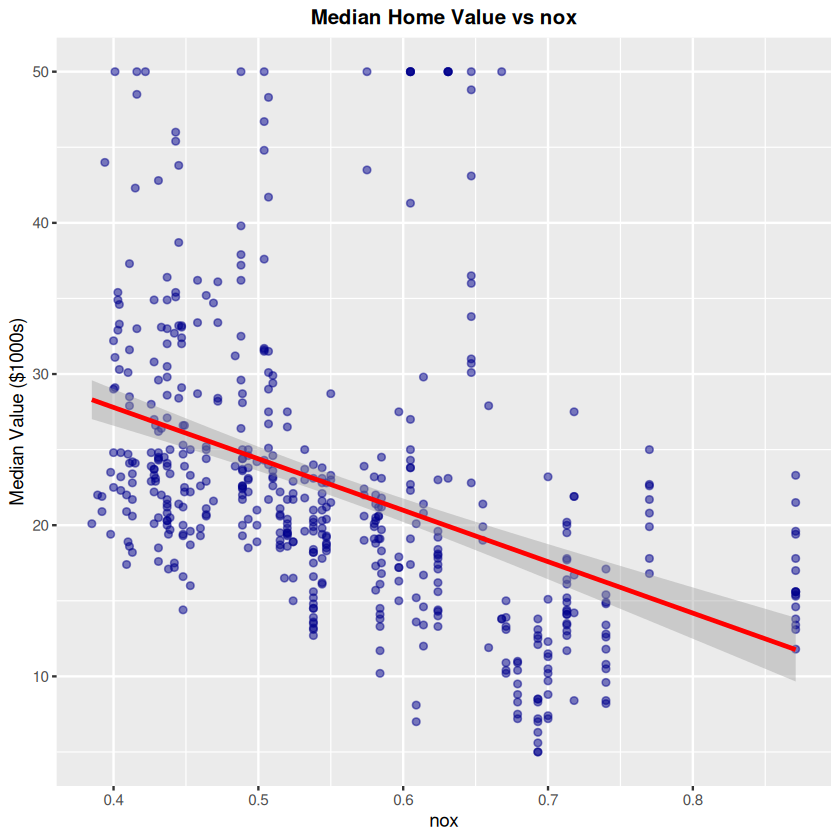

`geom_smooth()` using formula = 'y ~ x'


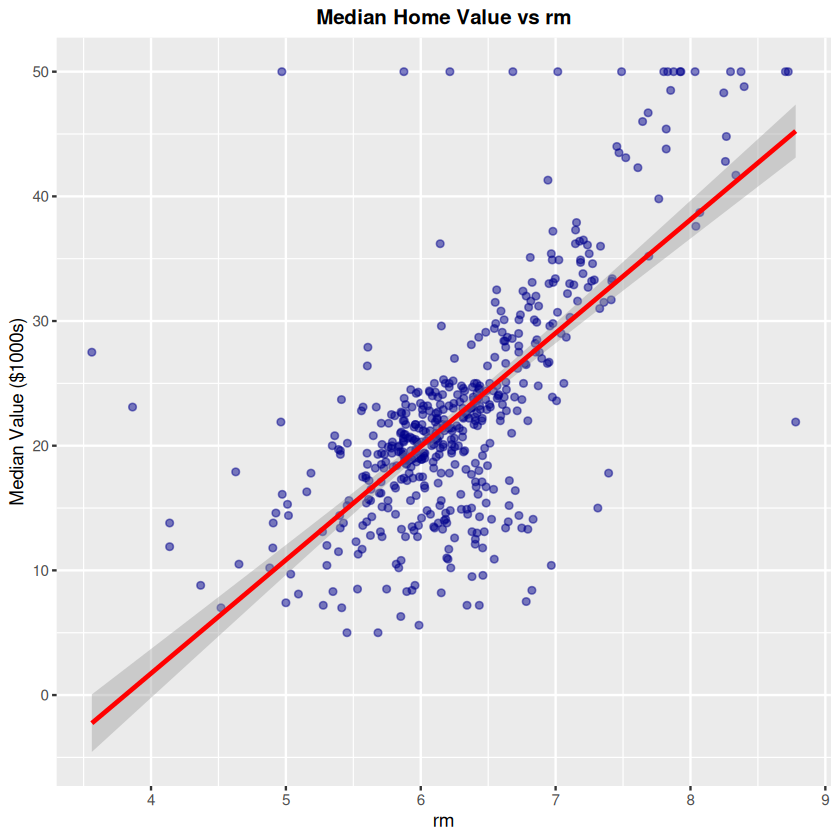

`geom_smooth()` using formula = 'y ~ x'


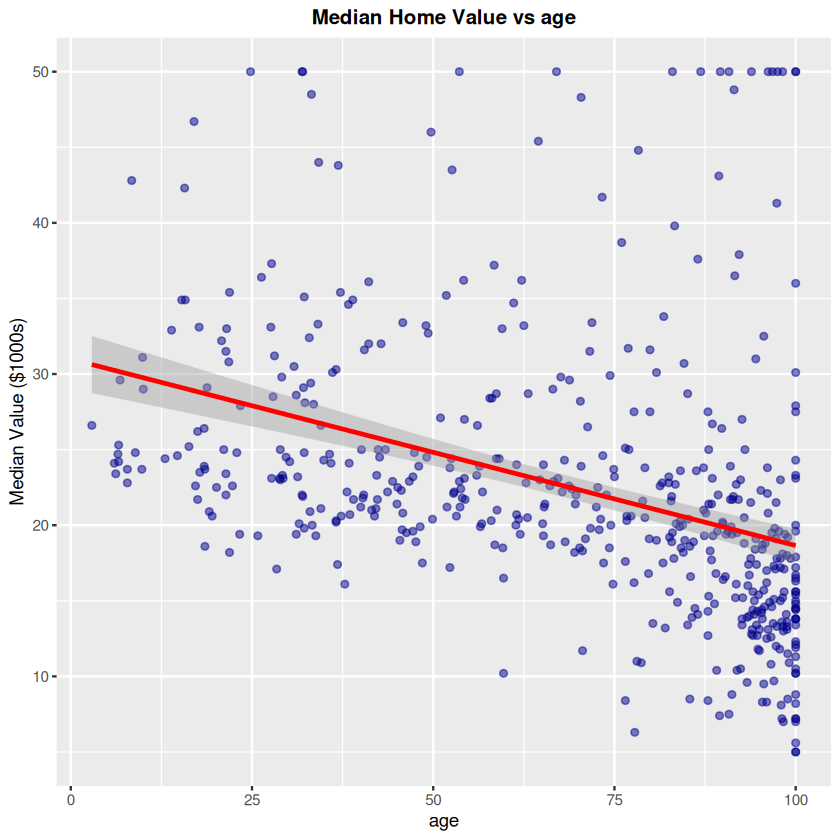

`geom_smooth()` using formula = 'y ~ x'


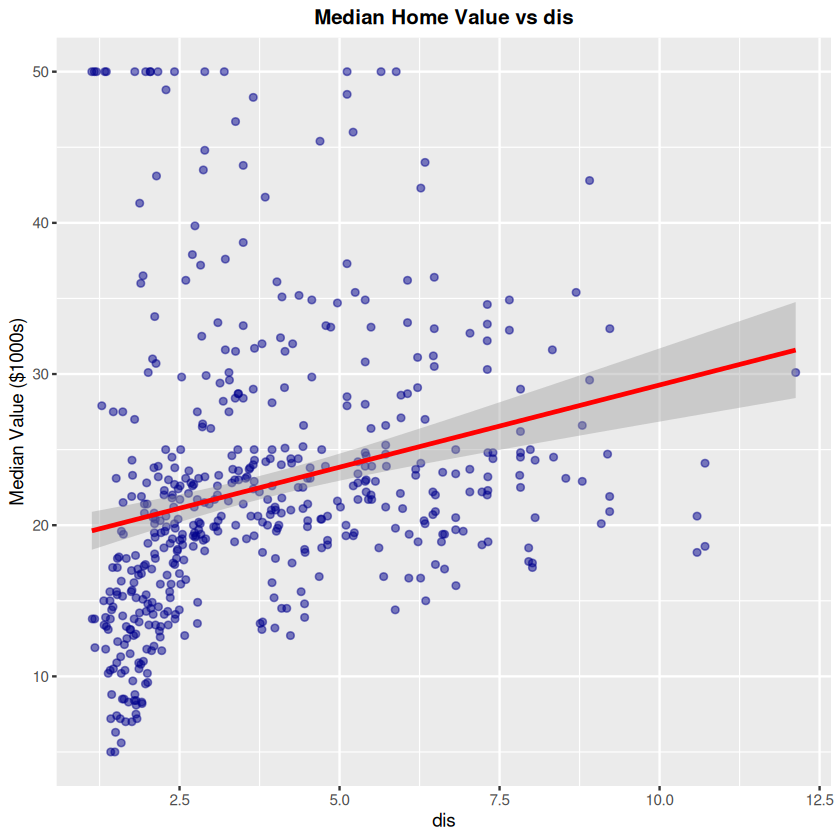

`geom_smooth()` using formula = 'y ~ x'


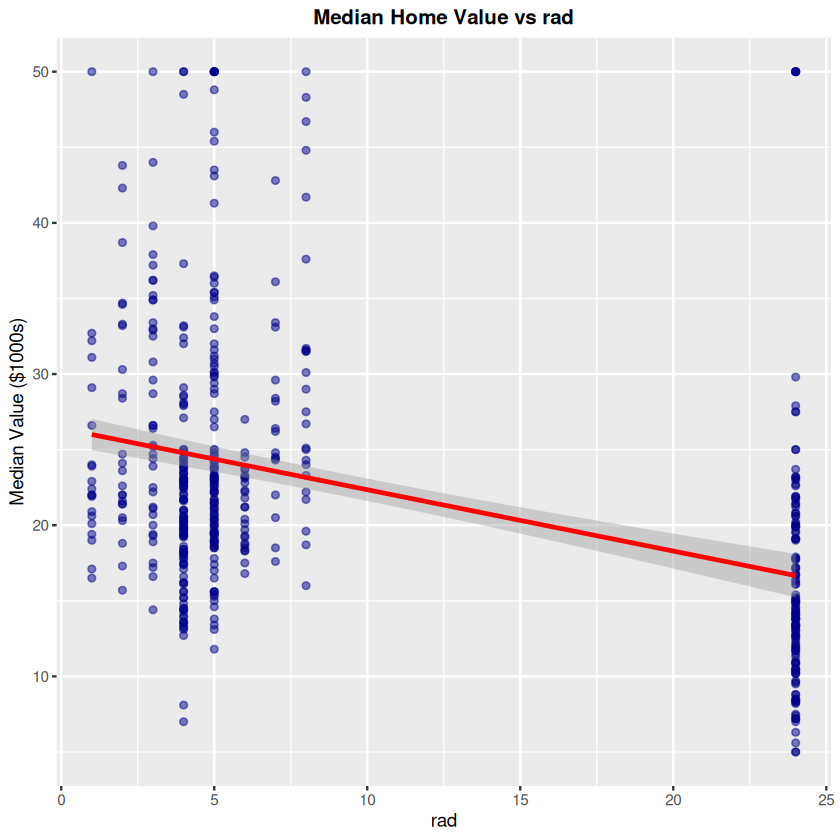

`geom_smooth()` using formula = 'y ~ x'


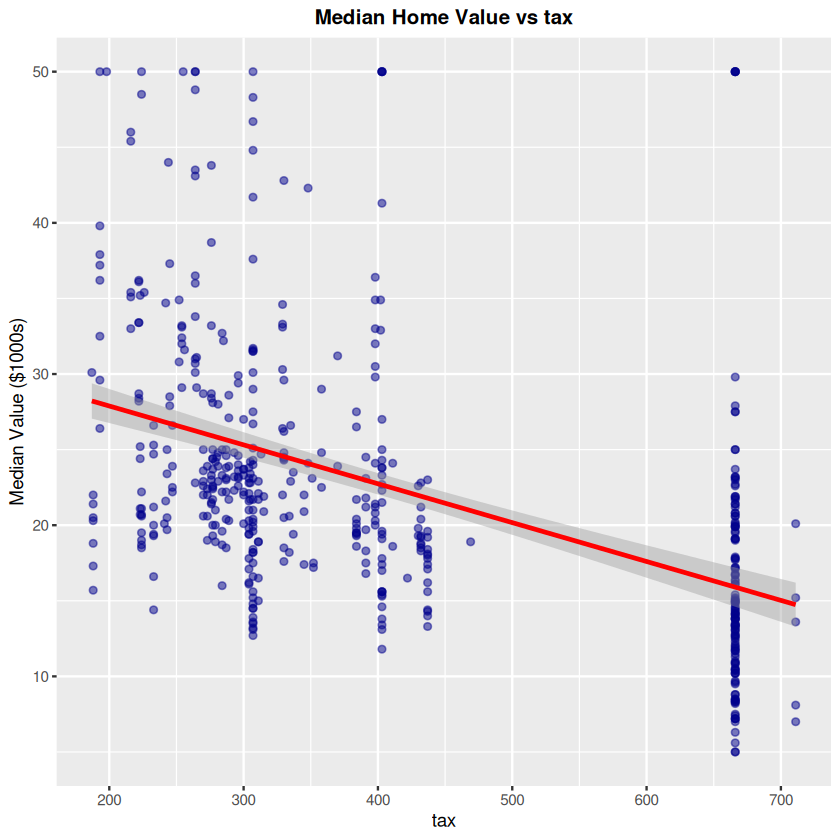

`geom_smooth()` using formula = 'y ~ x'


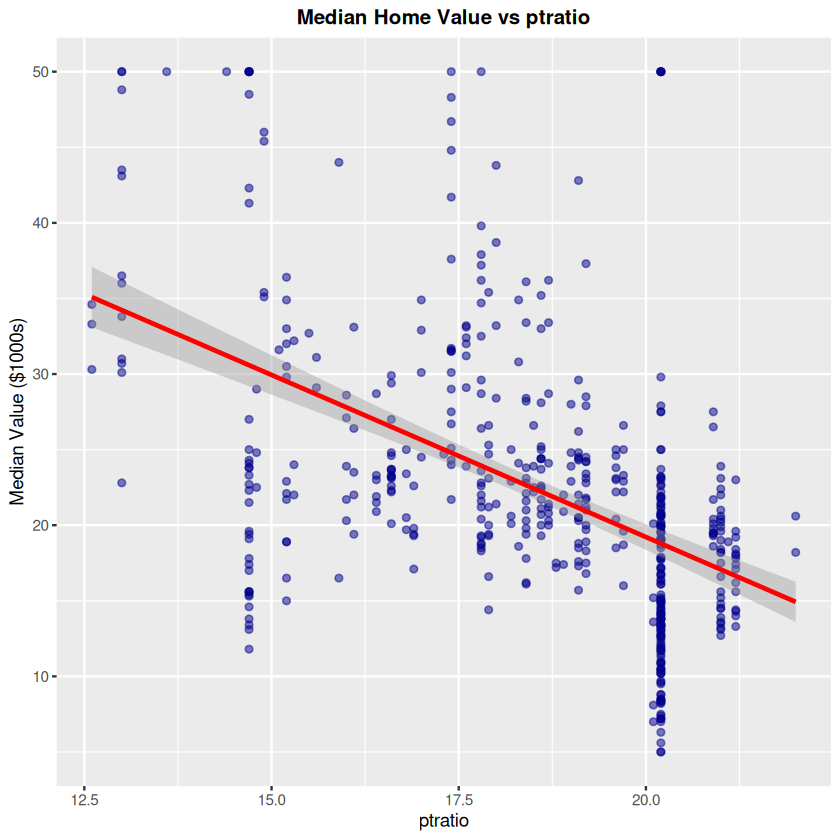

`geom_smooth()` using formula = 'y ~ x'


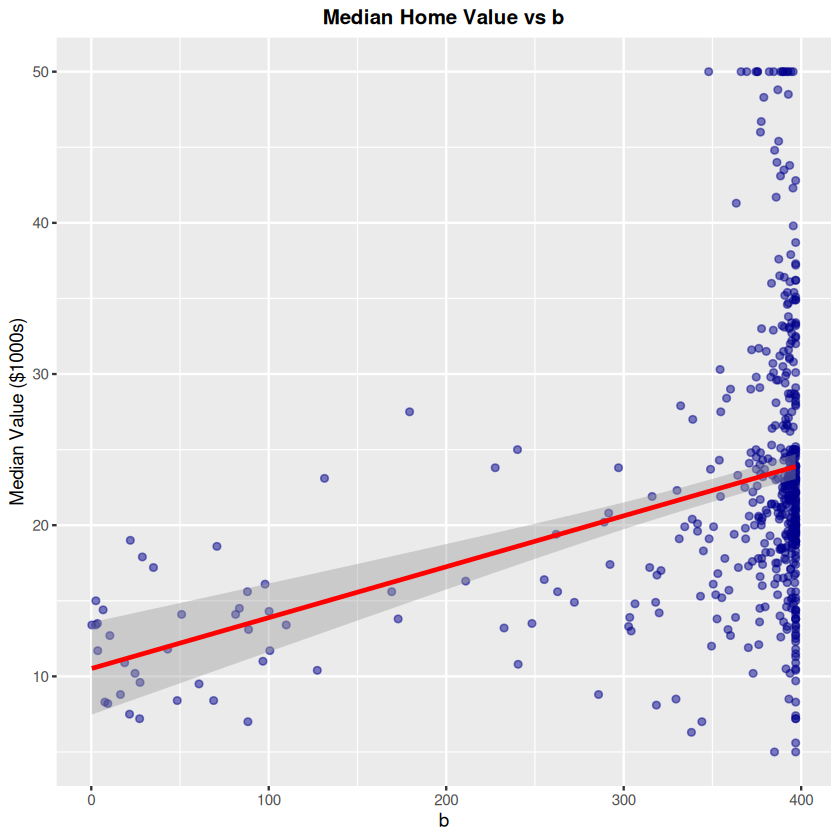

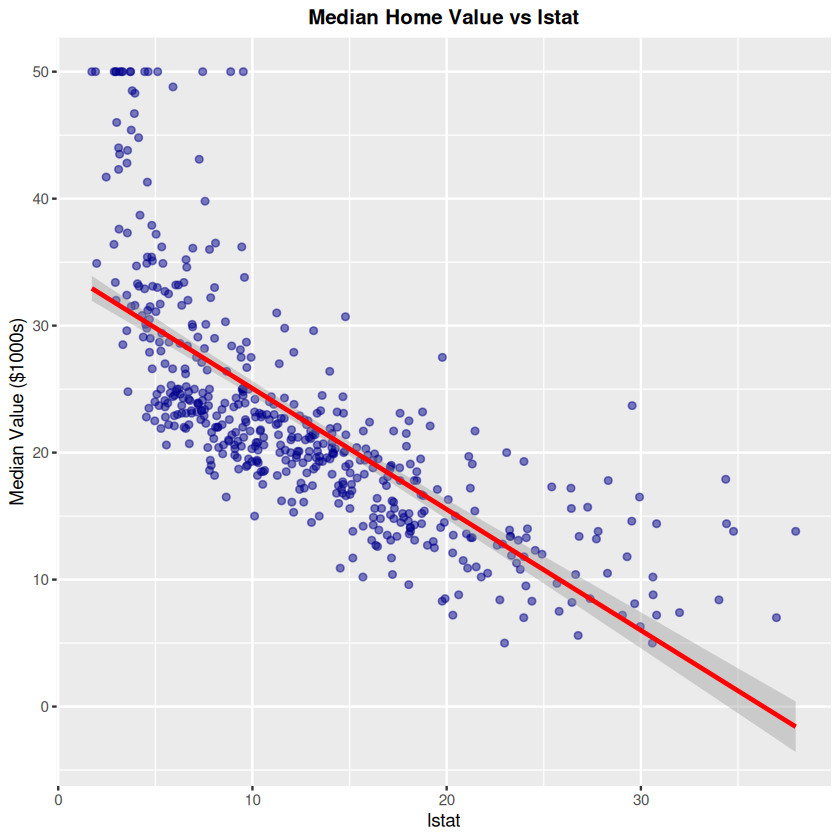

In [108]:
# Key Relationships with Target Variable (cmedv)
key_vars <- setdiff(names(numerical_vars), "cmedv")
scatter_plots <- list()

for (var in key_vars) {
  p <- ggplot(boston, aes(x = .data[[var]], y = cmedv)) +
    geom_point(alpha = 0.5, color = "darkblue") +
    geom_smooth(method = "lm", color = "red", se = TRUE) +
    labs(title = paste("Median Home Value vs", var), 
         x = var, 
         y = "Median Value ($1000s)") +
    theme(plot.title = element_text(hjust = 0.5, face = "bold", size = 12))
  
  scatter_plots[[var]] <- p
  
  # Save plot to disk
  ggsave(
    filename = paste0("assets/scatter_cmedv_vs_", var, ".png"),
    plot = p,
    width = 8,
    height = 6,
    dpi = 300
  )
}

# Display all plots
for (p in scatter_plots) {
  print(p)
}

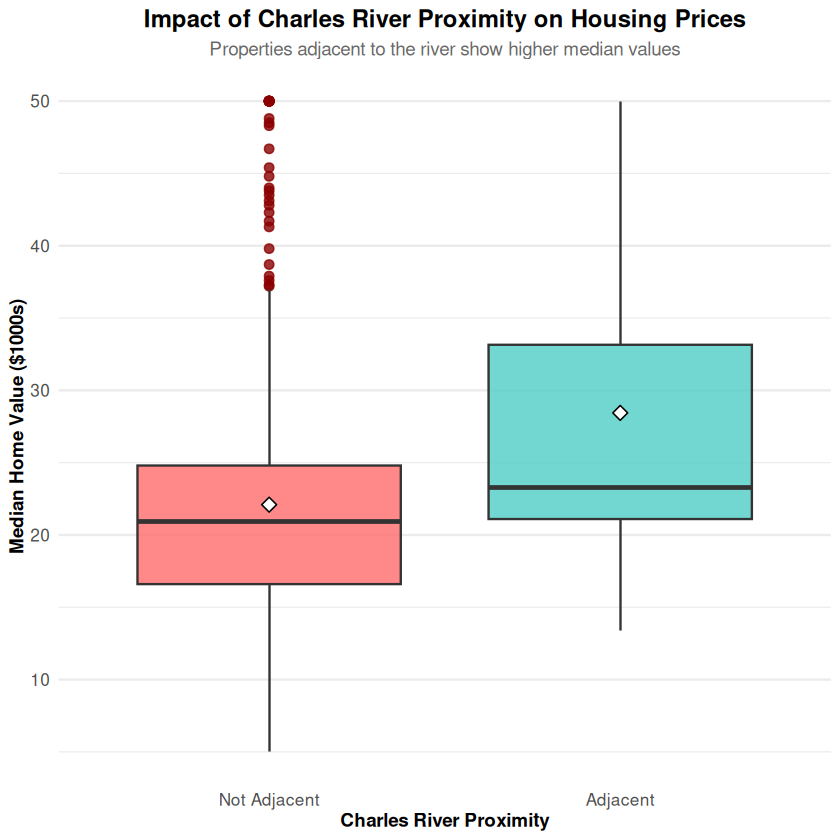

In [109]:
# Categorical vs Numerical: Charles River effect
if ("chas" %in% names(boston)) {
  p <- ggplot(boston, aes(x = factor(chas, labels = c("Not Adjacent", "Adjacent")), 
                          y = medv, 
                          fill = factor(chas))) +
    geom_boxplot(alpha = 0.8, outlier.color = "darkred", outlier.size = 2) +
    stat_summary(fun = mean, geom = "point", shape = 23, size = 3, 
                 fill = "white", color = "black") +
    labs(
      title = "Impact of Charles River Proximity on Housing Prices",
      subtitle = "Properties adjacent to the river show higher median values",
      x = "Charles River Proximity",
      y = "Median Home Value ($1000s)"
    ) +
    scale_fill_manual(values = c("0" = "#FF6B6B", "1" = "#4ECDC4")) +
    theme_minimal() +
    theme(
      legend.position = "none",
      plot.title = element_text(hjust = 0.5, face = "bold", size = 14),
      plot.subtitle = element_text(hjust = 0.5, size = 11, color = "gray40"),
      axis.title = element_text(face = "bold", size = 11),
      axis.text = element_text(size = 10),
      panel.grid.major.x = element_blank()
    )
  
  # Save plot to disk
  ggsave(
    filename = "assets/boxplot_medv_by_charles_river.png",
    plot = p,
    width = 8,
    height = 6,
    dpi = 300
  )
  
  # Display plot
  print(p)
}

## 5. Geographic Analysis

In [43]:
install.packages("ggspatial")

Installing package into ‘/home/kushal/R/x86_64-pc-linux-gnu-library/4.5’
(as ‘lib’ is unspecified)



also installing the dependency ‘rosm’




In [45]:
install.packages("prettymapr")

Installing package into ‘/home/kushal/R/x86_64-pc-linux-gnu-library/4.5’
(as ‘lib’ is unspecified)

also installing the dependency ‘rjson’




Creating interactive map of Boston housing prices...
Map saved to: assets/geographic_housing_prices.png


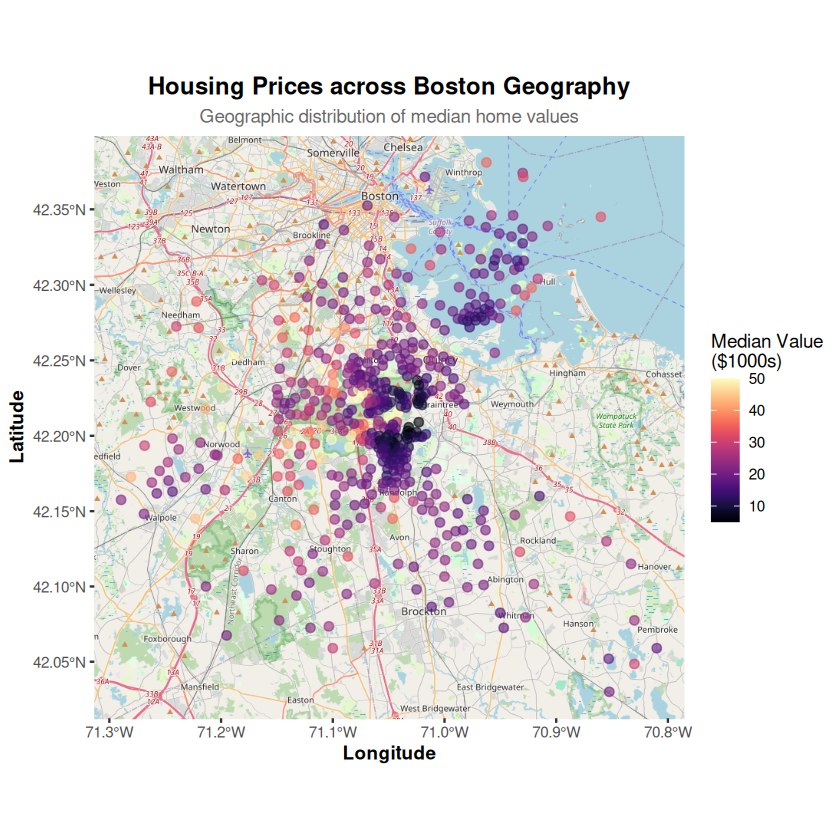

In [115]:
if (all(c("lon", "lat") %in% names(boston))) {
  cat("Creating interactive map of Boston housing prices...\n")

  p <- ggplot(boston, aes(x = lon, y = lat)) +
    annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
    geom_spatial_point(aes(color = cmedv), crs = 4326, size = 2, alpha = 0.6) +
    scale_color_viridis(option = "magma", name = "Median Value\n($1000s)") +
    labs(
      title = "Housing Prices across Boston Geography",
      subtitle = "Geographic distribution of median home values",
      x = "Longitude", 
      y = "Latitude"
    ) +
    theme(
      plot.title = element_text(hjust = 0.5, face = "bold", size = 14),
      plot.subtitle = element_text(hjust = 0.5, size = 11, color = "gray40"),
      axis.title = element_text(face = "bold")
    )
  
  # Save plot to disk
  ggsave(
    filename = "assets/geographic_housing_prices.png",
    plot = p,
    width = 10,
    height = 8,
    dpi = 300
  )
  
  cat("Map saved to: assets/geographic_housing_prices.png\n")
  
  # Display plot
  print(p)
}

Crime rate map saved to: assets/geographic_crime_rate.png


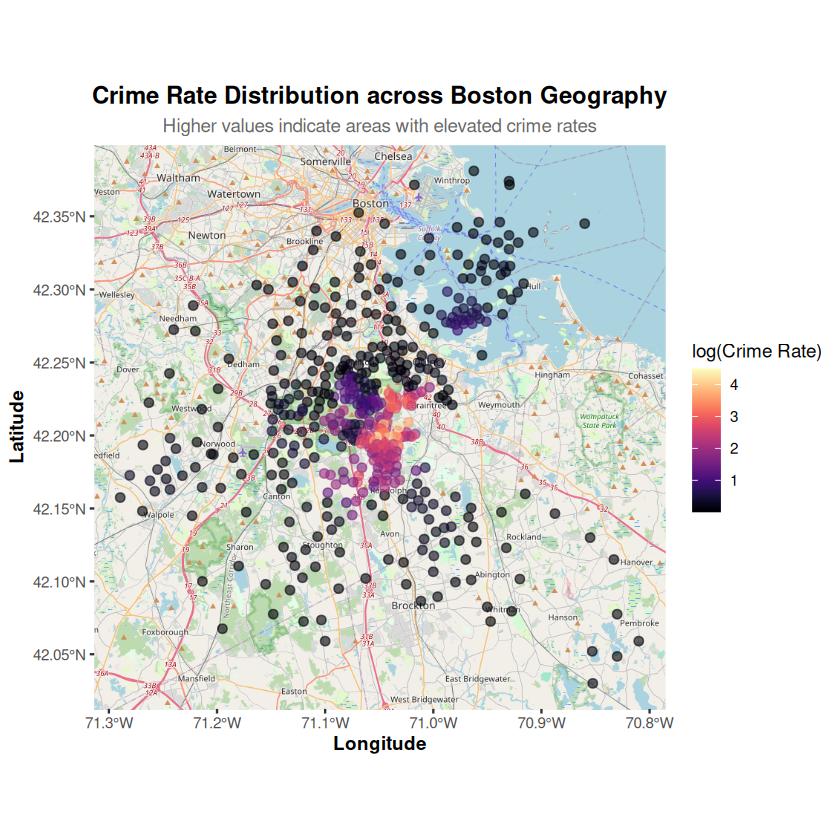

In [118]:
if (all(c("lon", "lat") %in% names(boston))) {
  p <- ggplot(boston, aes(x = lon, y = lat)) +
    annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
    geom_spatial_point(aes(color = log(crim + 1)), crs = 4326, size = 2, alpha = 0.6) +
    scale_color_viridis(option = "magma", name = "log(Crime Rate)") +
    labs(
      title = "Crime Rate Distribution across Boston Geography",
      subtitle = "Higher values indicate areas with elevated crime rates",
      x = "Longitude", 
      y = "Latitude"
    ) +
    theme(
      plot.title = element_text(hjust = 0.5, face = "bold", size = 14),
      plot.subtitle = element_text(hjust = 0.5, size = 11, color = "gray40"),
      axis.title = element_text(face = "bold")
    )
  
  # Save plot to disk
  ggsave(
    filename = "assets/geographic_crime_rate.png",
    plot = p,
    width = 10,
    height = 8,
    dpi = 300
  )
  
  cat("Crime rate map saved to: assets/geographic_crime_rate.png\n")
  
  # Display plot
  print(p)
}


Residential zoning map saved to: assets/geographic_residential_zoning.png


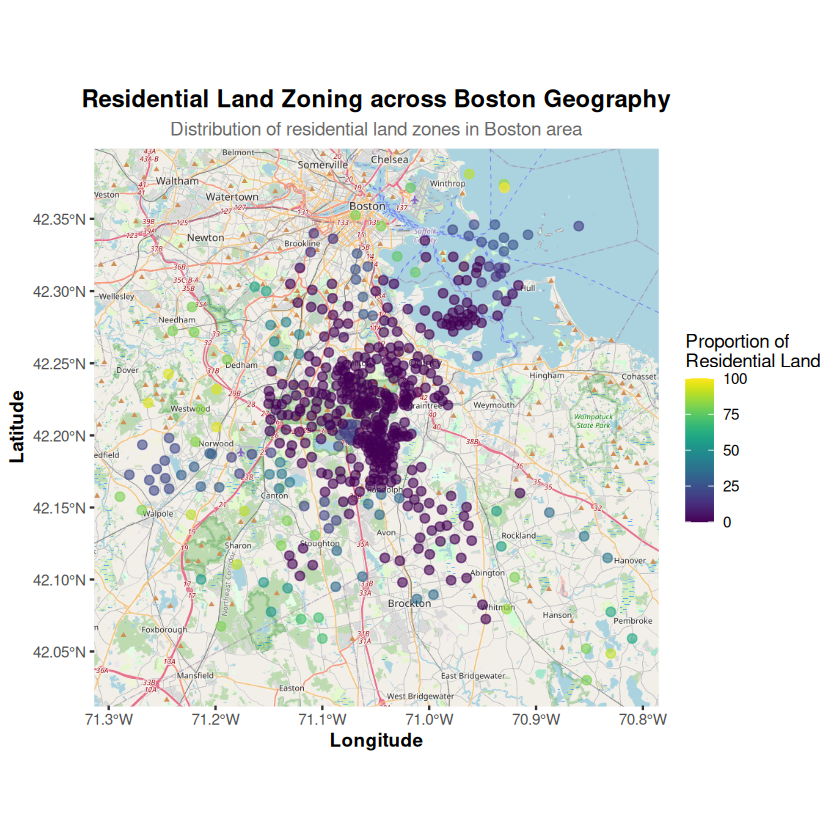

In [120]:
if (all(c("lon", "lat") %in% names(boston))) {
    p <- ggplot(boston, aes(x = lon, y = lat)) +
        annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
        geom_spatial_point(aes(color = zn), crs = 4326, size = 2, alpha = 0.6) +
        scale_color_viridis(option = "viridis", name = "Proportion of\nResidential Land") +
        labs(
            title = "Residential Land Zoning across Boston Geography",
            subtitle = "Distribution of residential land zones in Boston area",
            x = "Longitude", 
            y = "Latitude"
        ) +
        theme(
            plot.title = element_text(hjust = 0.5, face = "bold", size = 14),
            plot.subtitle = element_text(hjust = 0.5, size = 11, color = "gray40"),
            axis.title = element_text(face = "bold")
        )
    
    # Save plot to disk
    ggsave(
        filename = "assets/geographic_residential_zoning.png",
        plot = p,
        width = 10,
        height = 8,
        dpi = 300
    )
    
    cat("Residential zoning map saved to: assets/geographic_residential_zoning.png\n")
    
    # Display plot
    print(p)
}


Industrial land map saved to: assets/geographic_industrial_land.png


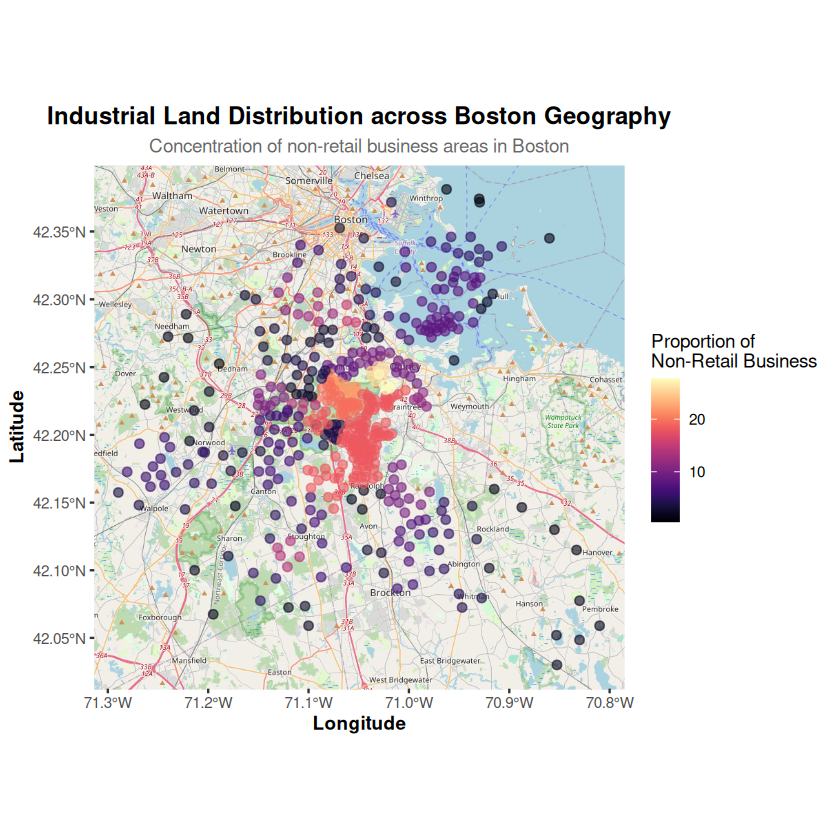

In [121]:
if (all(c("lon", "lat") %in% names(boston))) {
    p <- ggplot(boston, aes(x = lon, y = lat)) +
        annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
        geom_spatial_point(aes(color = indus), crs = 4326, size = 2, alpha = 0.6) +
        scale_color_viridis(option = "magma", name = "Proportion of\nNon-Retail Business") +
        labs(
            title = "Industrial Land Distribution across Boston Geography",
            subtitle = "Concentration of non-retail business areas in Boston",
            x = "Longitude", 
            y = "Latitude"
        ) +
        theme(
            plot.title = element_text(hjust = 0.5, face = "bold", size = 14),
            plot.subtitle = element_text(hjust = 0.5, size = 11, color = "gray40"),
            axis.title = element_text(face = "bold")
        )
    
    # Save plot to disk
    ggsave(
        filename = "assets/geographic_industrial_land.png",
        plot = p,
        width = 10,
        height = 8,
        dpi = 300
    )
    
    cat("Industrial land map saved to: assets/geographic_industrial_land.png\n")
    
    # Display plot
    print(p)
}


NOx concentration map saved to: assets/geographic_nox_concentration.png


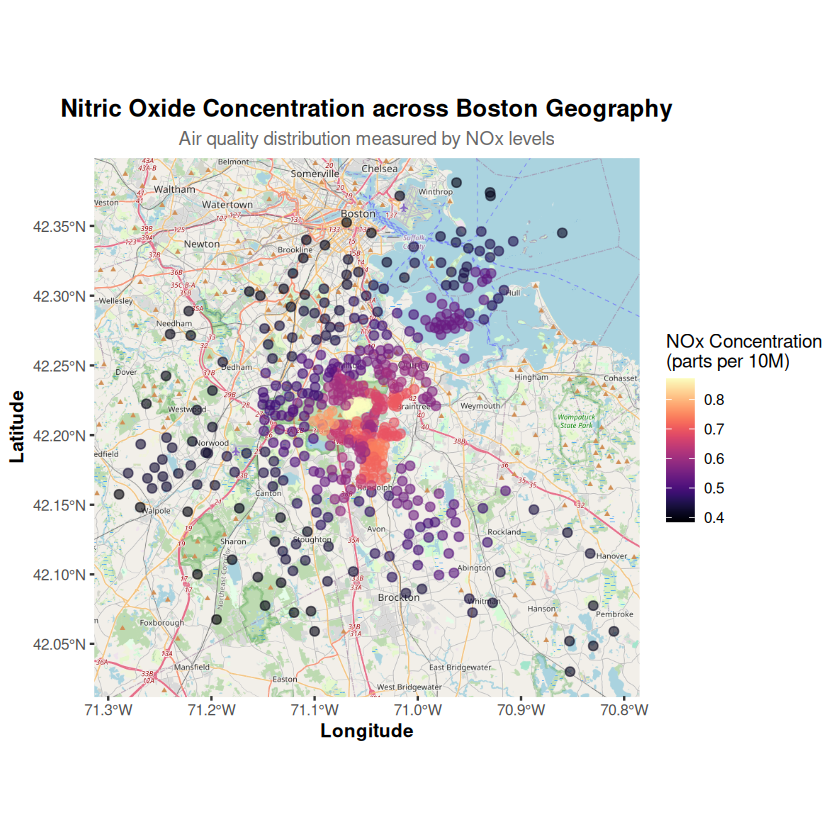

In [122]:
if (all(c("lon", "lat") %in% names(boston))) {
    p <- ggplot(boston, aes(x = lon, y = lat)) +
        annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
        geom_spatial_point(aes(color = nox), crs = 4326, size = 2, alpha = 0.6) +
        scale_color_viridis(option = "magma", name = "NOx Concentration\n(parts per 10M)") +
        labs(
            title = "Nitric Oxide Concentration across Boston Geography",
            subtitle = "Air quality distribution measured by NOx levels",
            x = "Longitude", 
            y = "Latitude"
        ) +
        theme(
            plot.title = element_text(hjust = 0.5, face = "bold", size = 14),
            plot.subtitle = element_text(hjust = 0.5, size = 11, color = "gray40"),
            axis.title = element_text(face = "bold")
        )
    
    # Save plot to disk
    ggsave(
        filename = "assets/geographic_nox_concentration.png",
        plot = p,
        width = 10,
        height = 8,
        dpi = 300
    )
    
    cat("NOx concentration map saved to: assets/geographic_nox_concentration.png\n")
    
    # Display plot
    print(p)
}


Average rooms map saved to: assets/geographic_average_rooms.png


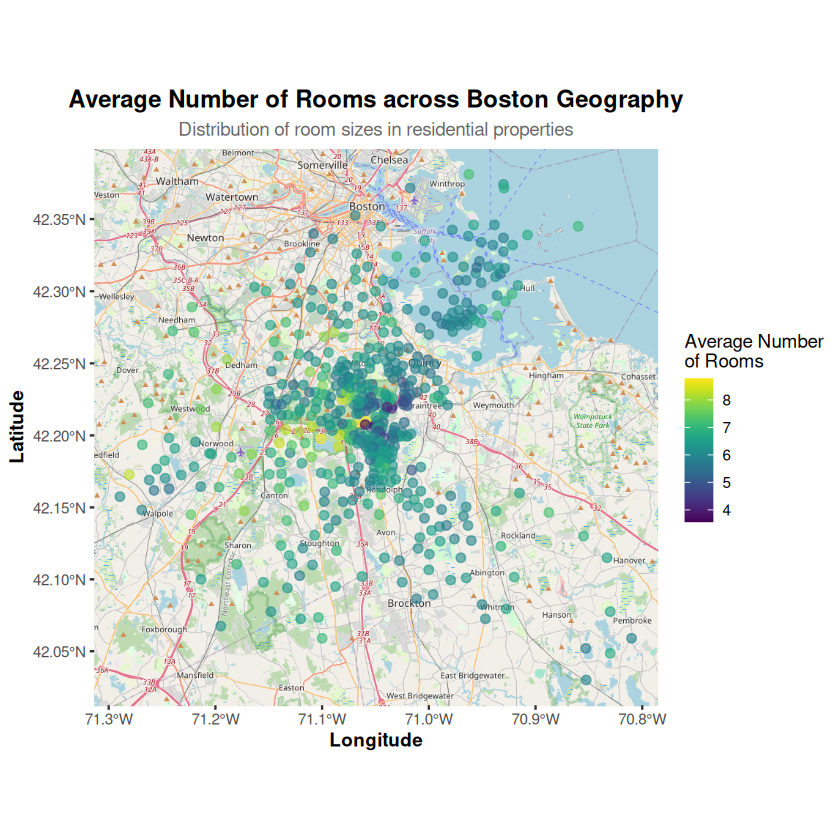

In [123]:
if (all(c("lon", "lat") %in% names(boston))) {
    p <- ggplot(boston, aes(x = lon, y = lat)) +
        annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
        geom_spatial_point(aes(color = rm), crs = 4326, size = 2, alpha = 0.6) +
        scale_color_viridis(option = "viridis", name = "Average Number\nof Rooms") +
        labs(
            title = "Average Number of Rooms across Boston Geography",
            subtitle = "Distribution of room sizes in residential properties",
            x = "Longitude", 
            y = "Latitude"
        ) +
        theme(
            plot.title = element_text(hjust = 0.5, face = "bold", size = 14),
            plot.subtitle = element_text(hjust = 0.5, size = 11, color = "gray40"),
            axis.title = element_text(face = "bold")
        )
    
    # Save plot to disk
    ggsave(
        filename = "assets/geographic_average_rooms.png",
        plot = p,
        width = 10,
        height = 8,
        dpi = 300
    )
    
    cat("Average rooms map saved to: assets/geographic_average_rooms.png\n")
    
    # Display plot
    print(p)
}


Housing age map saved to: assets/geographic_housing_age.png


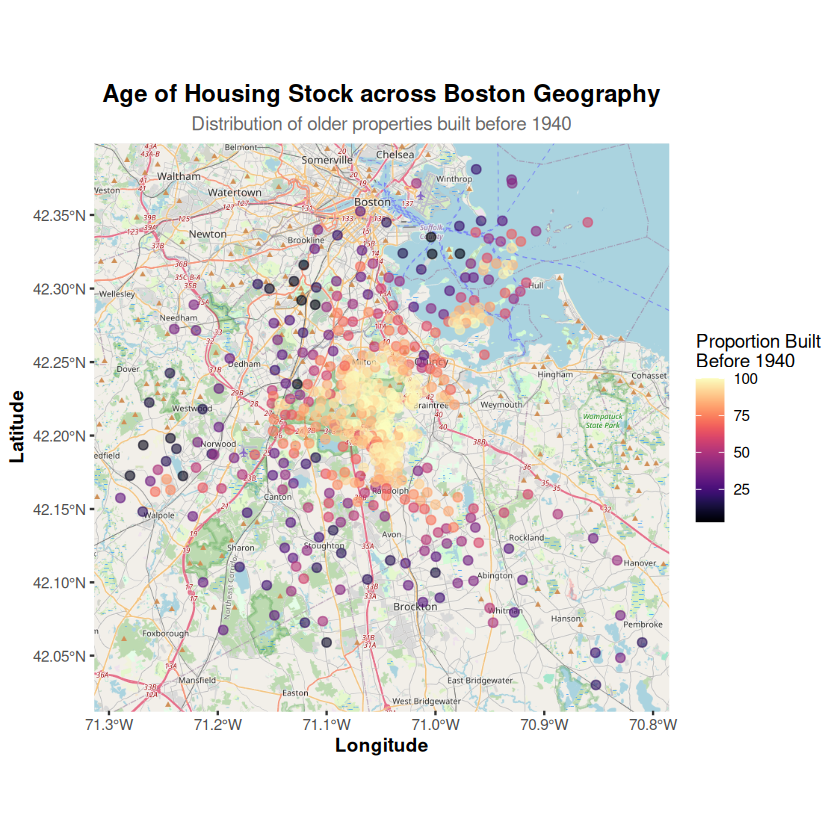

In [125]:
if (all(c("lon", "lat") %in% names(boston))) {
    p <- ggplot(boston, aes(x = lon, y = lat)) +
        annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
        geom_spatial_point(aes(color = age), crs = 4326, size = 2, alpha = 0.6) +
        scale_color_viridis(option = "magma", name = "Proportion Built\nBefore 1940") +
        labs(
            title = "Age of Housing Stock across Boston Geography",
            subtitle = "Distribution of older properties built before 1940",
            x = "Longitude", 
            y = "Latitude"
        ) +
        theme(
            plot.title = element_text(hjust = 0.5, face = "bold", size = 14),
            plot.subtitle = element_text(hjust = 0.5, size = 11, color = "gray40"),
            axis.title = element_text(face = "bold")
        )
    
    # Save plot to disk
    ggsave(
        filename = "assets/geographic_housing_age.png",
        plot = p,
        width = 10,
        height = 8,
        dpi = 300
    )
    
    cat("Housing age map saved to: assets/geographic_housing_age.png\n")
    
    # Display plot
    print(p)
}


Employment distance map saved to: assets/geographic_employment_distance.png


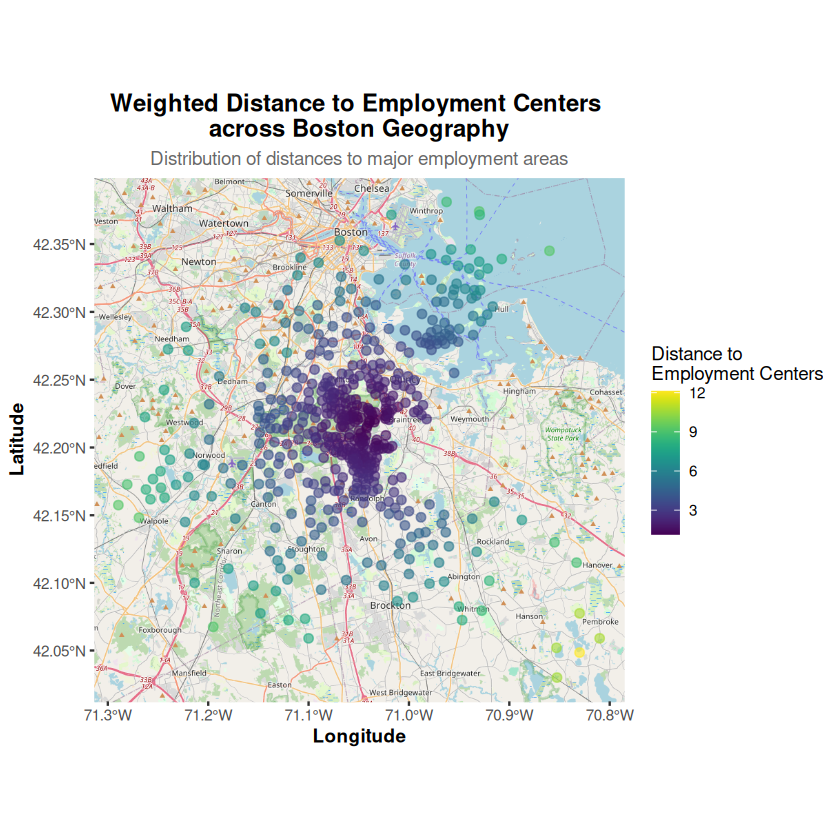

In [127]:
if (all(c("lon", "lat") %in% names(boston))) {
    p <- ggplot(boston, aes(x = lon, y = lat)) +
        annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
        geom_spatial_point(aes(color = dis), crs = 4326, size = 2, alpha = 0.6) +
        scale_color_viridis(option = "viridis", name = "Distance to\nEmployment Centers") +
        labs(
            title = "Weighted Distance to Employment Centers \nacross Boston Geography",
            subtitle = "Distribution of distances to major employment areas",
            x = "Longitude", 
            y = "Latitude"
        ) +
        theme(
            plot.title = element_text(hjust = 0.5, face = "bold", size = 14),
            plot.subtitle = element_text(hjust = 0.5, size = 11, color = "gray40"),
            axis.title = element_text(face = "bold")
        )
    
    # Save plot to disk
    ggsave(
        filename = "assets/geographic_employment_distance.png",
        plot = p,
        width = 10,
        height = 8,
        dpi = 300
    )
    
    cat("Employment distance map saved to: assets/geographic_employment_distance.png\n")
    
    # Display plot
    print(p)
}


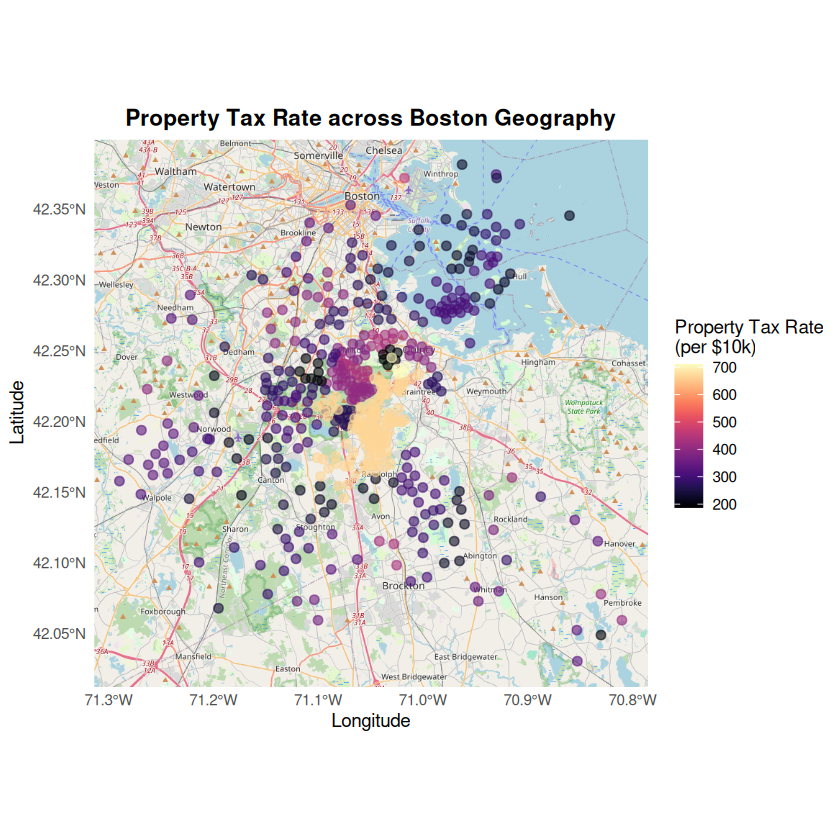

In [68]:
if (all(c("lon", "lat") %in% names(boston))) {
    print(
        ggplot(boston, aes(x = lon, y = lat)) +
            annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
            geom_spatial_point(aes(color = tax), crs = 4326, size = 2, alpha = 0.6) +
            scale_color_viridis(option = "magma", name = "Property Tax Rate\n(per $10k)") +
            labs(title = "Property Tax Rate across Boston Geography",
                 x = "Longitude", y = "Latitude") +
            theme_minimal() +
            theme(plot.title = element_text(hjust = 0.5, face = "bold"))
    )
}


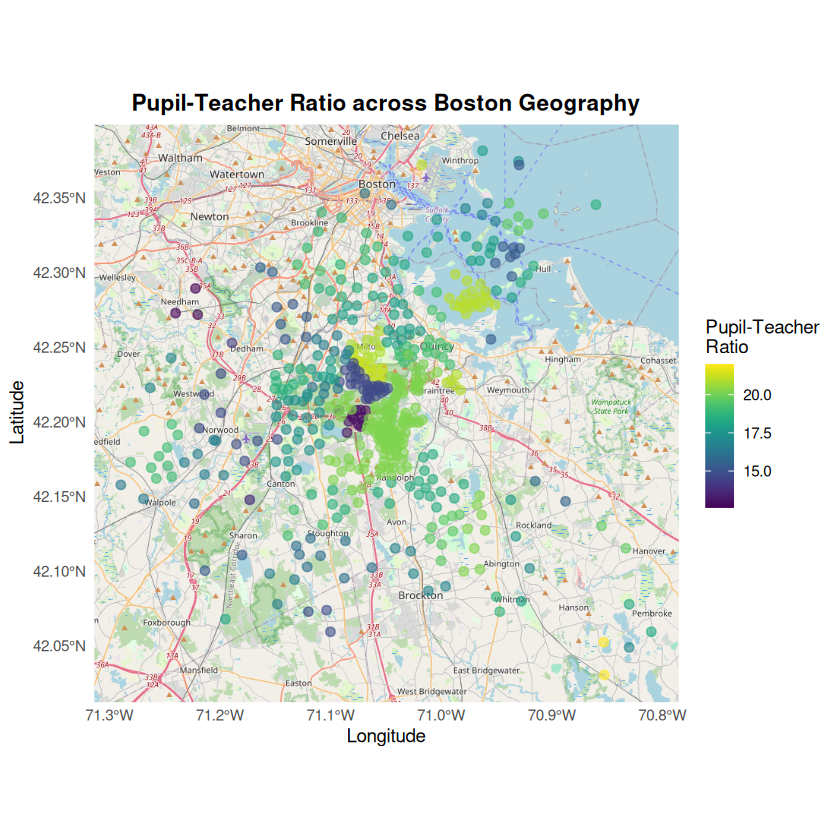

In [70]:
if (all(c("lon", "lat") %in% names(boston))) {
    print(
        ggplot(boston, aes(x = lon, y = lat)) +
            annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
            geom_spatial_point(aes(color = ptratio), crs = 4326, size = 2, alpha = 0.6) +
            scale_color_viridis(option = "viridis", name = "Pupil-Teacher\nRatio") +
            labs(title = "Pupil-Teacher Ratio across Boston Geography",
                 x = "Longitude", y = "Latitude") +
            theme_minimal() +
            theme(plot.title = element_text(hjust = 0.5, face = "bold"))
    )
}


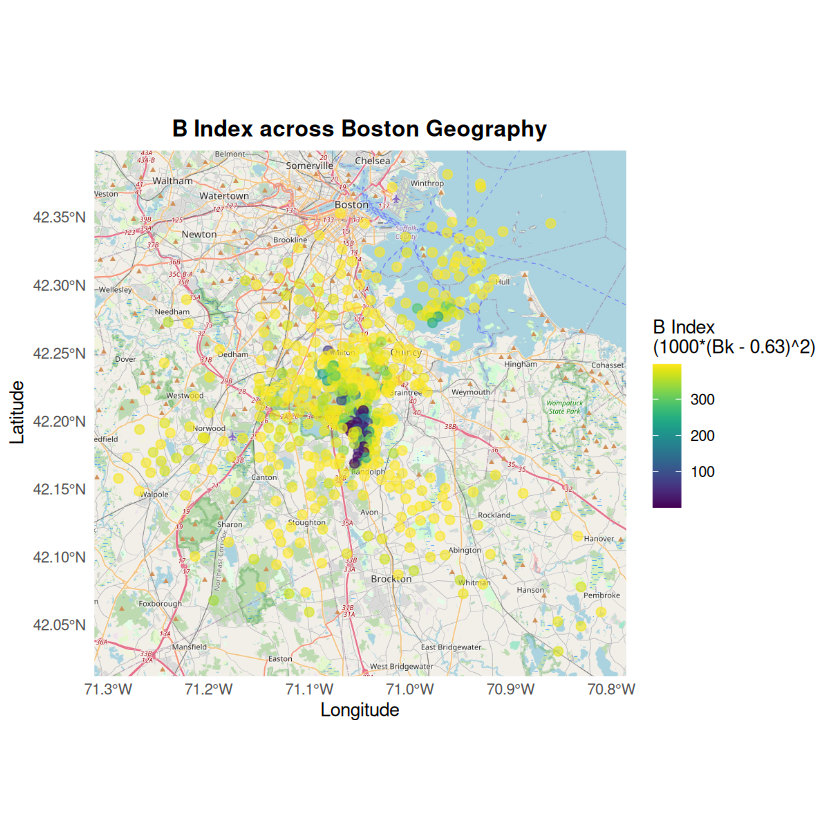

In [72]:
if (all(c("lon", "lat") %in% names(boston))) {
    print(
        ggplot(boston, aes(x = lon, y = lat)) +
            annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
            geom_spatial_point(aes(color = b), crs = 4326, size = 2, alpha = 0.6) +
            scale_color_viridis(option = "viridis", name = "B Index\n(1000*(Bk - 0.63)^2)") +
            labs(title = "B Index across Boston Geography",
                     x = "Longitude", y = "Latitude") +
            theme_minimal() +
            theme(plot.title = element_text(hjust = 0.5, face = "bold"))
    )
}


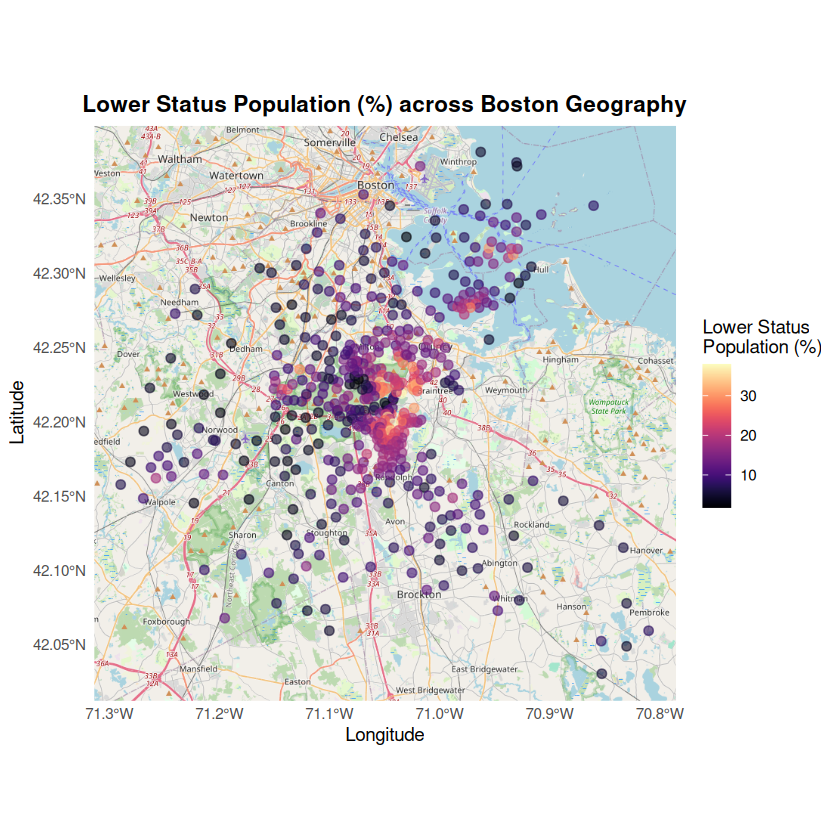

In [73]:
if (all(c("lon", "lat") %in% names(boston))) {
    print(
        ggplot(boston, aes(x = lon, y = lat)) +
            annotation_map_tile(type = "osm", progress = "none", zoomin = 0) +
            geom_spatial_point(aes(color = lstat), crs = 4326, size = 2, alpha = 0.6) +
            scale_color_viridis(option = "magma", name = "Lower Status\nPopulation (%)") +
            labs(title = "Lower Status Population (%) across Boston Geography",
                 x = "Longitude", y = "Latitude") +
            theme_minimal() +
            theme(plot.title = element_text(hjust = 0.5, face = "bold"))
    )
}


## 7. Outlier Detection

In [74]:
cat("\n=== OUTLIER DETECTION (IQR Method) ===\n")

detect_outliers <- function(x) {
  Q1 <- quantile(x, 0.25, na.rm = TRUE)
  Q3 <- quantile(x, 0.75, na.rm = TRUE)
  IQR_val <- Q3 - Q1
  lower <- Q1 - 1.5 * IQR_val
  upper <- Q3 + 1.5 * IQR_val
  outliers <- sum(x < lower | x > upper, na.rm = TRUE)
  return(outliers)
}

outlier_summary <- data.frame(
  Variable = names(numerical_vars),
  Outlier_Count = sapply(numerical_vars, detect_outliers),
  Outlier_Percent = round(sapply(numerical_vars, detect_outliers) / nrow(boston) * 100, 2)
)
print(outlier_summary[outlier_summary$Outlier_Count > 0, ])


=== OUTLIER DETECTION (IQR Method) ===


        Variable Outlier_Count Outlier_Percent
cmedv      cmedv            39            7.71
crim        crim            66           13.04
zn            zn            68           13.44
rm            rm            30            5.93
dis          dis             5            0.99
ptratio  ptratio            15            2.96
b              b            77           15.22
lstat      lstat             7            1.38


## 8. Feature Engineering

In [75]:
cat("\n=== FEATURE ENGINEERING ===\n")

boston_enhanced <- boston %>%
  mutate(
    # Crime rate categories
    crime_level = cut(crim,
                      breaks = c(-Inf, quantile(crim, c(0.33, 0.67)), Inf),
                      labels = c("Low", "Medium", "High")),

    # Room density (rooms per age unit)
    room_density = rm / (age + 1),

    # Accessibility index (combining rad and tax)
    accessibility_index = rad * tax / 1000,

    # Distance to employment (categorized)
    distance_category = cut(dis,
                           breaks = c(-Inf, 3, 5, Inf),
                           labels = c("Near", "Moderate", "Far")),

    # Large homes indicator
    large_home = ifelse(rm >= 7, 1, 0),

    # High crime indicator
    high_crime = ifelse(crim > median(crim), 1, 0)
  )

cat("New features created successfully!\n")
cat(paste("New columns:", paste(setdiff(names(boston_enhanced), names(boston)), collapse = ", "), "\n"))


=== FEATURE ENGINEERING ===
New features created successfully!
New columns: crime_level, room_density, accessibility_index, distance_category, large_home, high_crime 


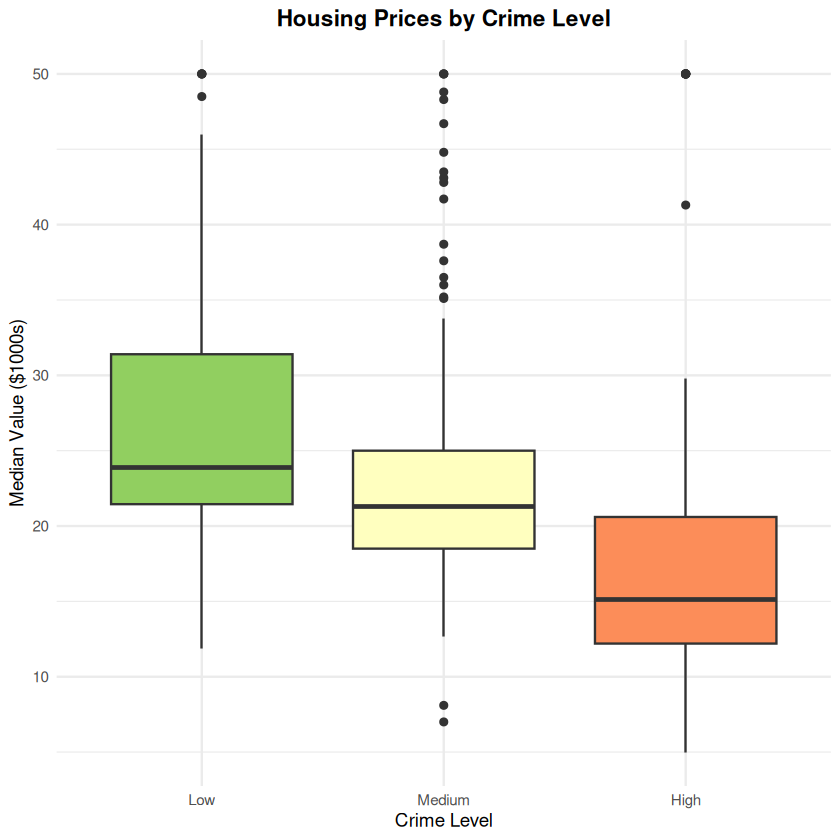

In [76]:
# Visualize new features
ggplot(boston_enhanced, aes(x = crime_level, y = medv, fill = crime_level)) +
  geom_boxplot() +
  labs(title = "Housing Prices by Crime Level",
       x = "Crime Level", y = "Median Value ($1000s)") +
  scale_fill_brewer(palette = "RdYlGn", direction = -1) +
  theme_minimal() +
  theme(legend.position = "none", plot.title = element_text(hjust = 0.5, face = "bold"))

## 9. Statistical Tests

In [24]:
cat("\n=== STATISTICAL TESTS ===\n")

# Normality Tests (Shapiro-Wilk for sample)
cat("\nNormality Tests (Shapiro-Wilk) for Key Variables:\n")
test_vars <- c("medv", "rm", "lstat", "crim")
for (var in test_vars) {
  if (var %in% names(boston)) {
    sample_data <- sample(boston[[var]], min(5000, length(boston[[var]])))
    test_result <- shapiro.test(sample_data)
    cat(paste(var, ": W =", round(test_result$statistic, 4),
              ", p-value =", format(test_result$p.value, scientific = TRUE), "\n"))
  }
}


=== STATISTICAL TESTS ===

Normality Tests (Shapiro-Wilk) for Key Variables:
medv : W = 0.9172 , p-value = 4.941386e-16 
rm : W = 0.9609 , p-value = 2.411977e-10 
lstat : W = 0.9369 , p-value = 8.286632e-14 
crim : W = 0.45 , p-value = 1.328589e-36 


In [25]:
# Correlation Significance
cat("\nSignificant Correlations with medv (p < 0.05):\n")
cor_tests <- lapply(names(numerical_vars)[names(numerical_vars) != "medv"], function(var) {
  test <- cor.test(boston$medv, boston[[var]])
  data.frame(Variable = var,
             Correlation = round(test$estimate, 3),
             P_value = format(test$p.value, scientific = TRUE))
})
cor_test_df <- do.call(rbind, cor_tests) %>% arrange(desc(abs(Correlation)))
print(cor_test_df)


Significant Correlations with medv (p < 0.05):
      Variable Correlation      P_value
cor3     cmedv       0.998        0e+00
cor15    lstat      -0.738 5.081103e-88
cor8        rm       0.695 2.487229e-74
cor13  ptratio      -0.508 1.609509e-34
cor6     indus      -0.484  4.90026e-31
cor12      tax      -0.469 5.637734e-29
cor7       nox      -0.427 7.065042e-24
cor      tract       0.426 9.070375e-24
cor4      crim      -0.388 1.173987e-19
cor11      rad      -0.382 5.465933e-19
cor9       age      -0.377 1.569982e-18
cor5        zn       0.360 5.713584e-17
cor14        b       0.333 1.318113e-14
cor1       lon      -0.321 1.456311e-13
cor10      dis       0.250 1.206612e-08
cor2       lat       0.010 8.283904e-01


In [26]:
# ANOVA for categorical variables
if ("chas" %in% names(boston)) {
  cat("\nANOVA: Effect of Charles River on Housing Prices:\n")
  anova_result <- aov(medv ~ factor(chas), data = boston)
  print(summary(anova_result))
}


ANOVA: Effect of Charles River on Housing Prices:
              Df Sum Sq Mean Sq F value   Pr(>F)    
factor(chas)   1   1312  1312.1   15.97 7.39e-05 ***
Residuals    504  41404    82.2                     
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1


## 10. Key Insights Summary

In [27]:
cat("\n=== KEY INSIGHTS ===\n")
cat("1. Target Variable (medv) Range:", range(boston$medv, na.rm = TRUE)[1], "-",
    range(boston$medv, na.rm = TRUE)[2], "$1000s\n")
cat("2. Strongest Positive Correlation with medv:",
    names(which.max(cor_matrix["medv", cor_matrix["medv",] != 1])), "\n")
cat("3. Strongest Negative Correlation with medv:",
    names(which.min(cor_matrix["medv",])), "\n")
cat("4. Most Skewed Variable:",
    skew_kurt$Variable[which.max(abs(skew_kurt$Skewness))], "\n")
cat("5. Variable with Most Outliers:",
    outlier_summary$Variable[which.max(outlier_summary$Outlier_Count)], "\n")

cat("\n=== EDA COMPLETE ===\n")


=== KEY INSIGHTS ===
1. Target Variable (medv) Range: 5 - 50 $1000s
2. Strongest Positive Correlation with medv: cmedv 
3. Strongest Negative Correlation with medv: lstat 
4. Most Skewed Variable: crim 
5. Variable with Most Outliers: b 

=== EDA COMPLETE ===
